# Task 1

Create plots showing the meter readings for seasonal, monthly, daily, and hourly measurements\
-- This exercise is to show your skills in data wrangling and visualization

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

# file_path = '/content/drive/My Drive/cons_data_all_res.xlsx'

# data = pd.read_excel(file_path)

In [ ]:
# alternate way to load the dataset, make sure to keep the .xlsx file in the same directory as the notebook

file_path2 = 'cons_data_all_res.xlsx'

data = pd.read_excel(file_path2)

In [ ]:
data

,Time,year,moy_date,doy_date,busday,season,dow_date,hour,month_name,temp,...,r3,r4,r5,r6,r7,r8,r9,r10,r11,r12
0,2017-01-01 00:00:00,2017,1,1,False,Winter,1,0,January,22.0,...,0.0821,0.0667,0.2131,0.0854,0.1277,0.2173,0.1478,0.1568,1.1462,0.2553
1,2017-01-01 01:00:00,2017,1,1,False,Winter,1,1,January,22.0,...,0.0989,0.1047,0.1719,0.0948,0.1112,0.2411,0.1597,0.4315,0.2193,0.5326
2,2017-01-01 02:00:00,2017,1,1,False,Winter,1,2,January,22.0,...,0.0990,0.1001,0.1865,0.0978,0.1850,0.8316,0.2118,1.4843,0.1563,0.3818
3,2017-01-01 03:00:00,2017,1,1,False,Winter,1,3,January,23.5,...,0.1038,0.1354,0.1882,0.1064,0.0970,0.6645,0.2361,1.3716,0.2327,0.3798
4,2017-01-01 04:00:00,2017,1,1,False,Winter,1,4,January,27.0,...,0.0780,0.3508,0.2092,0.2456,0.1374,1.9451,0.3902,0.2105,0.2395,0.5176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2017-12-31 19:00:00,2017,12,365,False,Winter,1,19,December,23.5,...,0.0447,0.0896,0.1475,0.0889,0.1258,0.1211,0.1620,0.1375,0.5079,0.1471
8756,2017-12-31 20:00:00,2017,12,365,False,Winter,1,20,December,24.0,...,0.0223,0.0584,0.1649,0.0883,0.1166,0.1056,0.1639,0.1367,0.1133,0.1921
8757,2017-12-31 21:00:00,2017,12,365,False,Winter,1,21,December,23.0,...,0.0521,0.1000,0.1887,0.0977,0.0997,0.1052,0.1642,0.1791,0.1159,0.1581
8758,2017-12-31 22:00:00,2017,12,365,False,Winter,1,22,December,22.0,...,0.0485,0.1067,0.1874,0.0950,0.1459,0.1232,0.1654,0.1425,0.4760,0.2320


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 23 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Time        8760 non-null   datetime64[ns]
 1   year        8760 non-null   int64         
 2   moy_date    8760 non-null   int64         
 3   doy_date    8760 non-null   int64         
 4   busday      8760 non-null   bool          
 5   season      8760 non-null   object        
 6   dow_date    8760 non-null   int64         
 7   hour        8760 non-null   int64         
 8   month_name  8760 non-null   object        
 9   temp        8760 non-null   float64       
 10  humid       8760 non-null   float64       
 11  r1          8760 non-null   float64       
 12  r2          8760 non-null   float64       
 13  r3          8760 non-null   float64       
 14  r4          8760 non-null   float64       
 15  r5          8760 non-null   float64       
 16  r6          8760 non-nul

In [ ]:
data.isnull().sum()

Time          0
year          0
moy_date      0
doy_date      0
busday        0
season        0
dow_date      0
hour          0
month_name    0
temp          0
humid         0
r1            0
r2            0
r3            0
r4            0
r5            0
r6            0
r7            0
r8            0
r9            0
r10           0
r11           0
r12           0
dtype: int64

Since there are no null values, we don't have to remove or replace any values.

In [ ]:
data.columns

Index(['Time', 'year', 'moy_date', 'doy_date', 'busday', 'season', 'dow_date',
       'hour', 'month_name', 'temp', 'humid', 'r1', 'r2', 'r3', 'r4', 'r5',
       'r6', 'r7', 'r8', 'r9', 'r10', 'r11', 'r12'],
      dtype='object')

## Time Series Plots

### Over the entire given period

Let's plot the data over the entire time period and understand the type of plots we get.

In [ ]:
# function to plot the data for each meter
def plot_energy_over_time(num):
  plt.figure(figsize=(10, 6))
  plt.xlabel('Time')
  plt.ylabel('Energy Reading')
  plt.title(f'Energy Meter Readings Over Time for r{num}')
  plt.plot(data['Time'], data[f'r{num}'])
  # plt.grid(True) # doesn't really make the plot look nice
  plt.show()

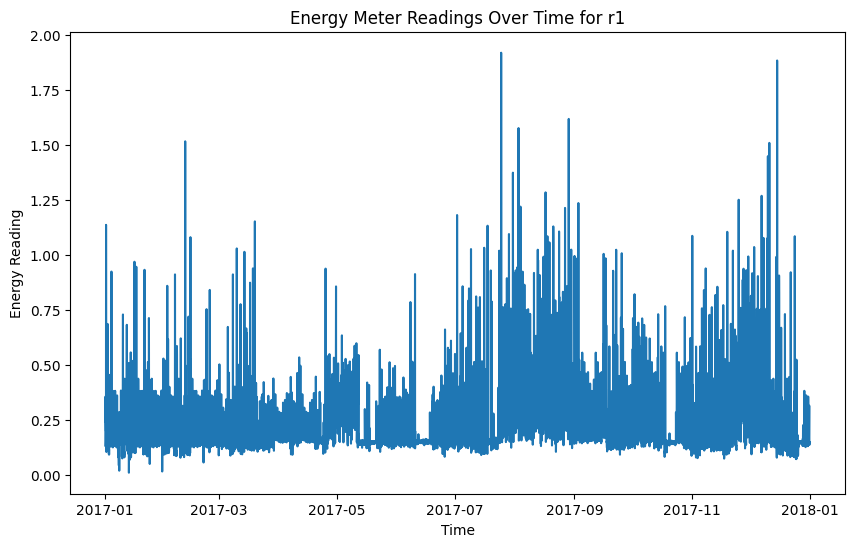

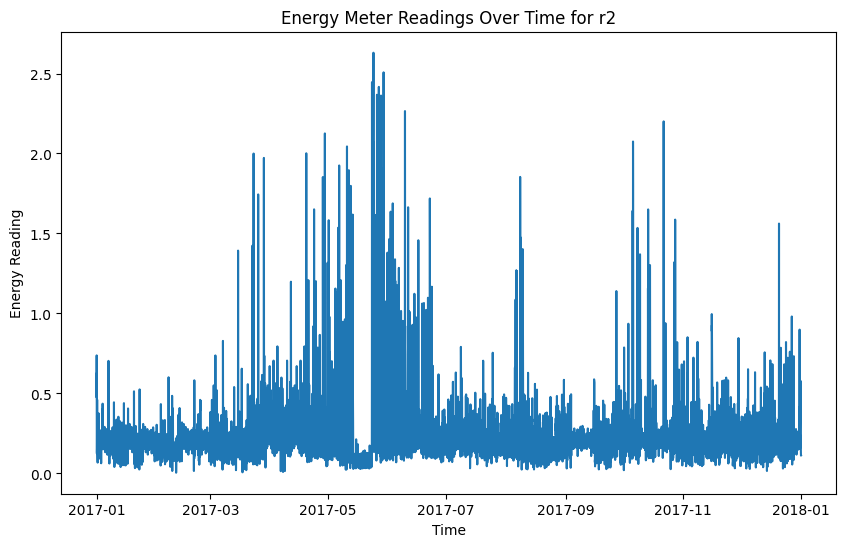

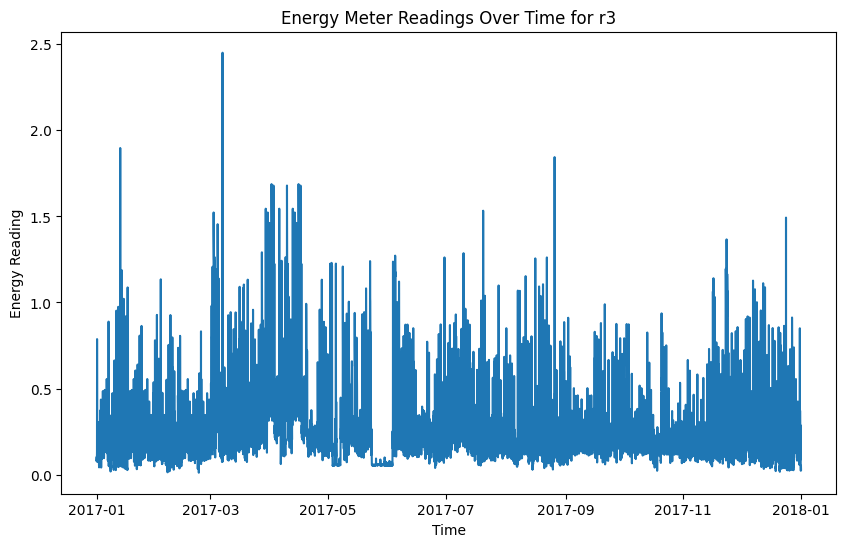

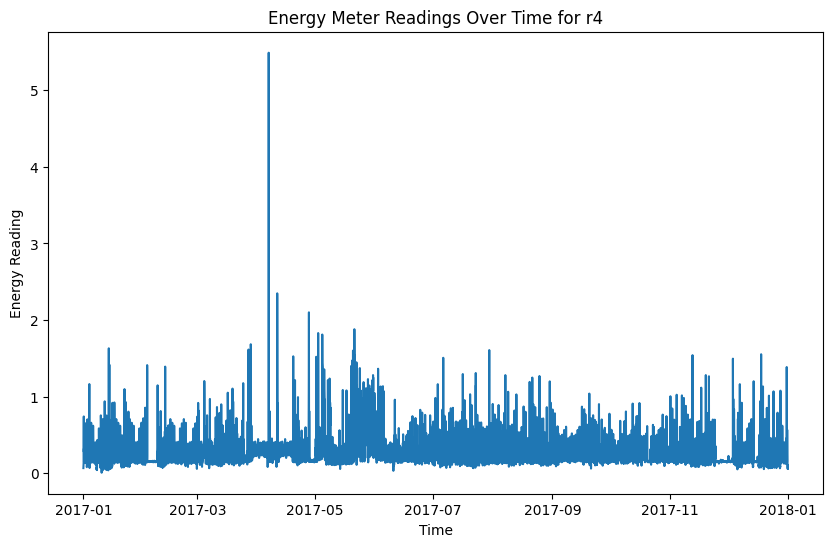

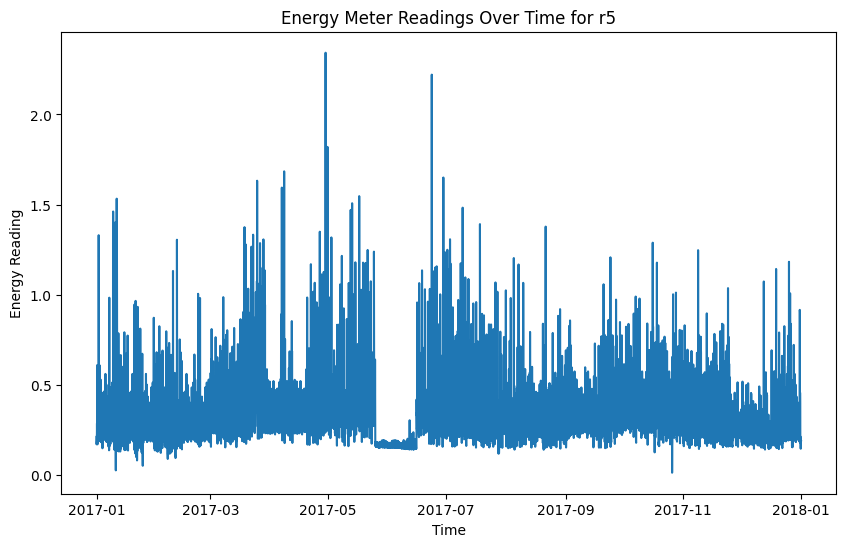

...

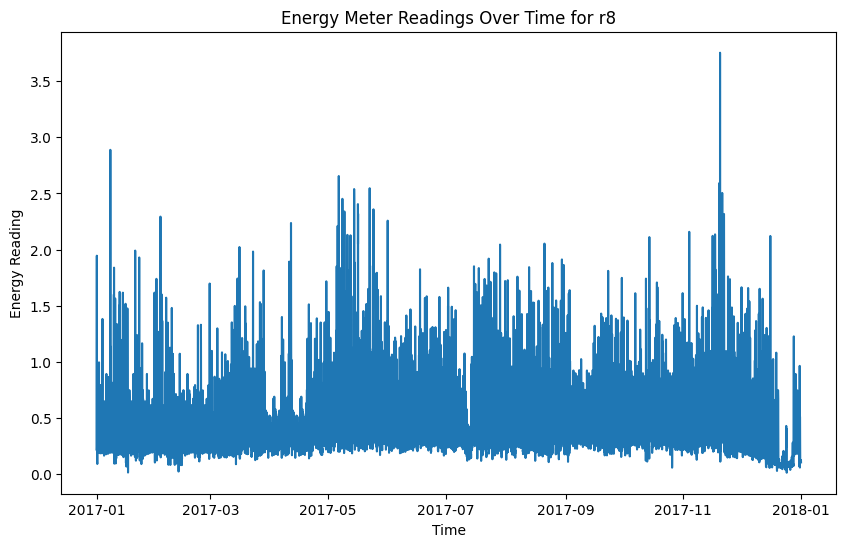

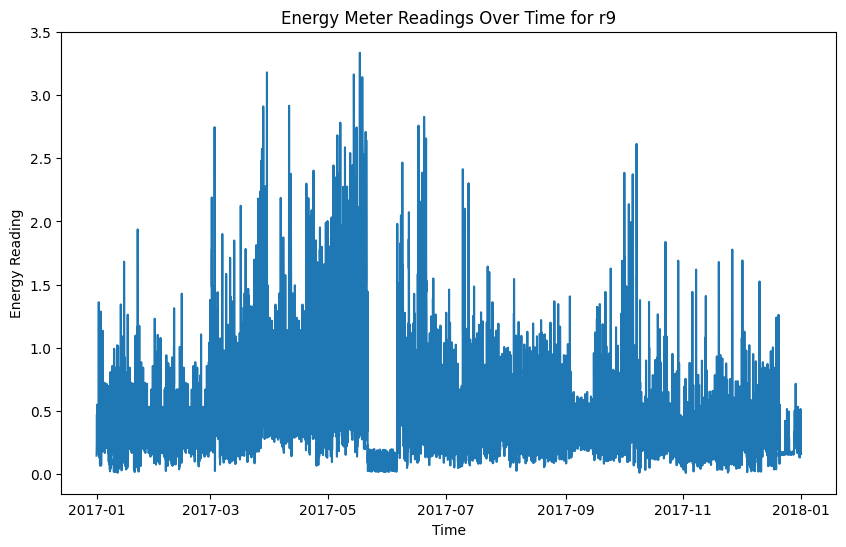

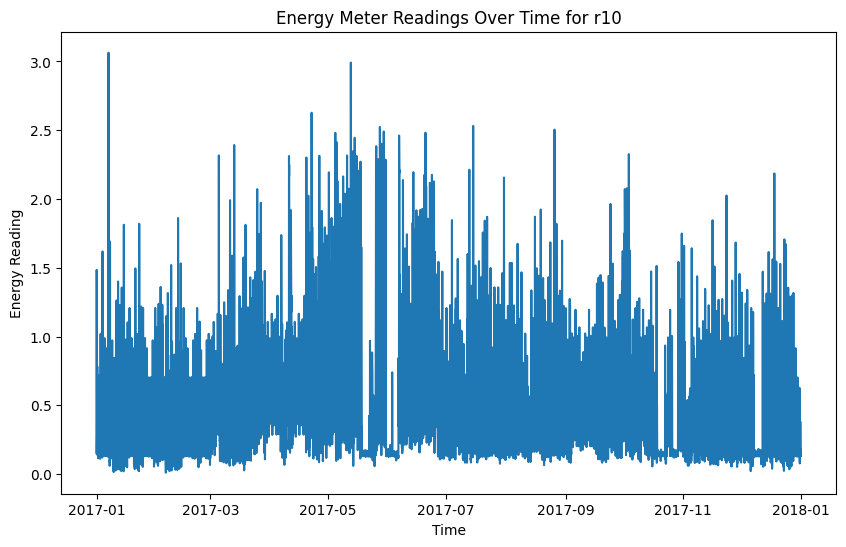

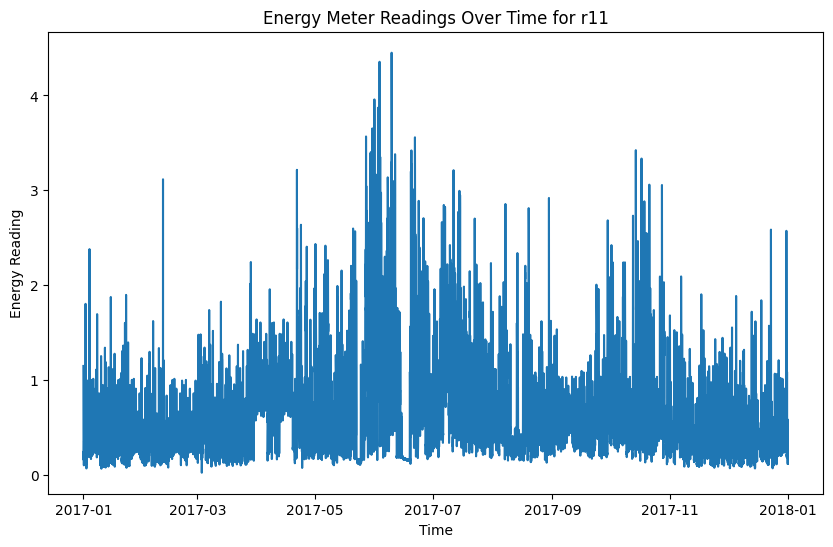

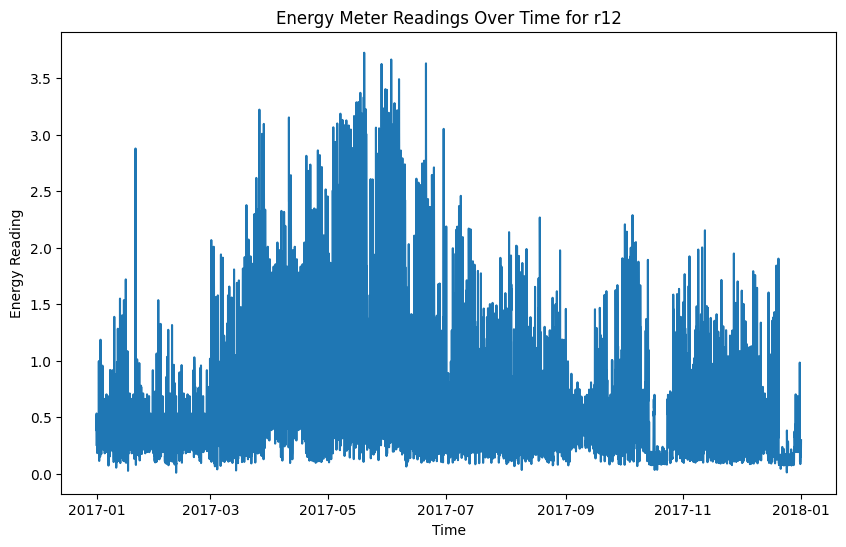

In [ ]:
for i in range(1, 13):
  plot_energy_over_time(i)

Let's clear up these plots a little more.

In [ ]:
# function to plot the data of all time, color coded according to season, for each meter
def plot_energy_over_time_season(num, data):
  plt.figure(figsize=(10, 6))

  df_sorted = data.sort_values('Time', ascending=True)

  # group by season and plot each season's data in a different color
  # treat every season as a separate series, but plot on the same graph
  for i, (series_name, series) in enumerate(df_sorted.groupby('season')):

    # palette = list(sns.palettes.mpl_palette('Dark2')) # can use this for a different color palette
    xs = series['Time']
    ys = series[f'r{num}']

    # plot each season's series
    plt.plot(xs, ys, label=series_name) #, color=palette[i % len(palette)]) # include the color parameter to invoke the palette defined in line 7

  plt.legend(title='season', bbox_to_anchor=(1, 1), loc='upper left')

  # determine the maximum y value for the y ticks

  # y_min = df_sorted[f'r{num}'].min() # not needed, we can simply use 0 as the minimum for a cleaner look
  y_max = df_sorted[f'r{num}'].max()
  y_max_adjusted = np.ceil(y_max / 0.5) * 0.5 # round up to the nearest integer and then multiple of 0.5

  # for ensuring uniformity in y ticks across meters
  y_ticks = np.arange(0, y_max_adjusted + 0.5, 0.5) # can adjust the step as per requirements
  plt.yticks(y_ticks)

  plt.xlabel('Time')
  plt.ylabel(f'r{num}')
  plt.title(f'Energy Meter Readings Over Time for r{num}')
  plt.show()

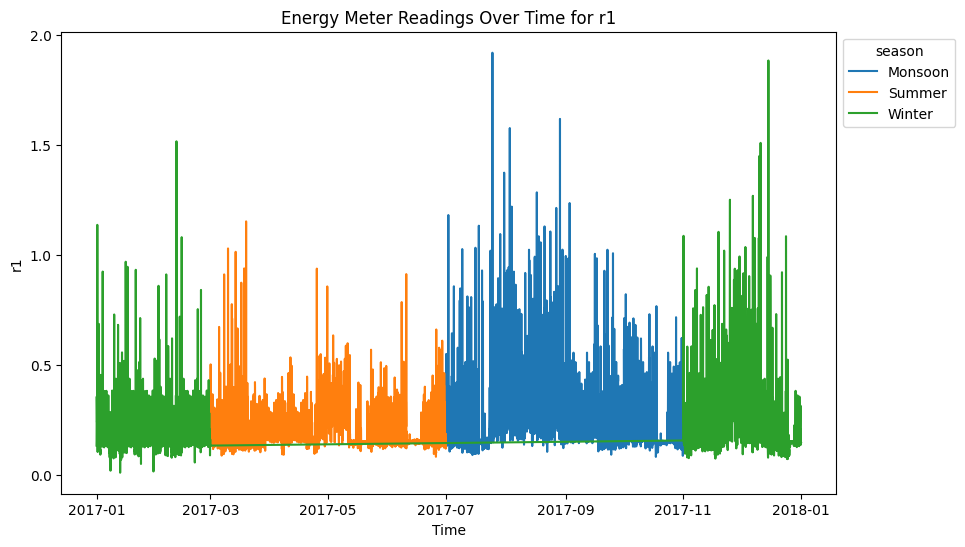

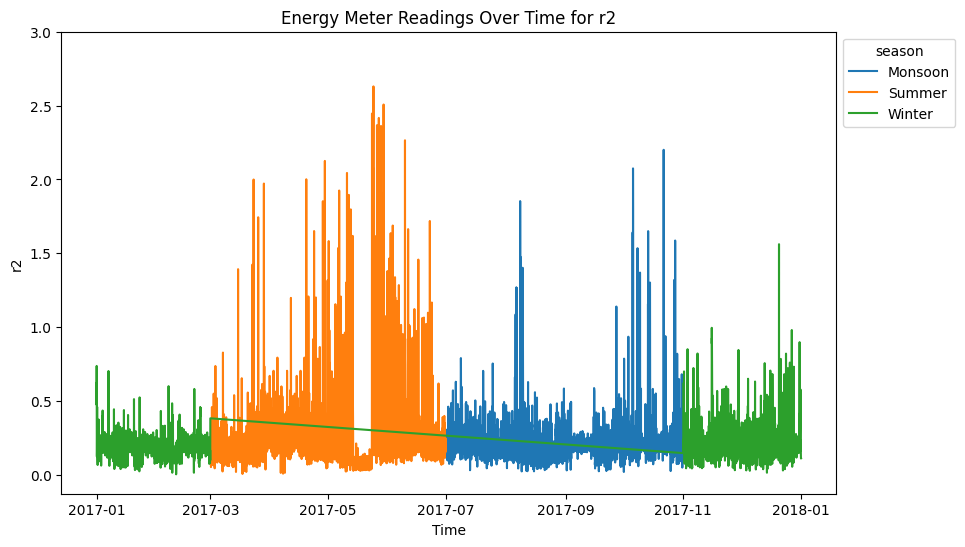

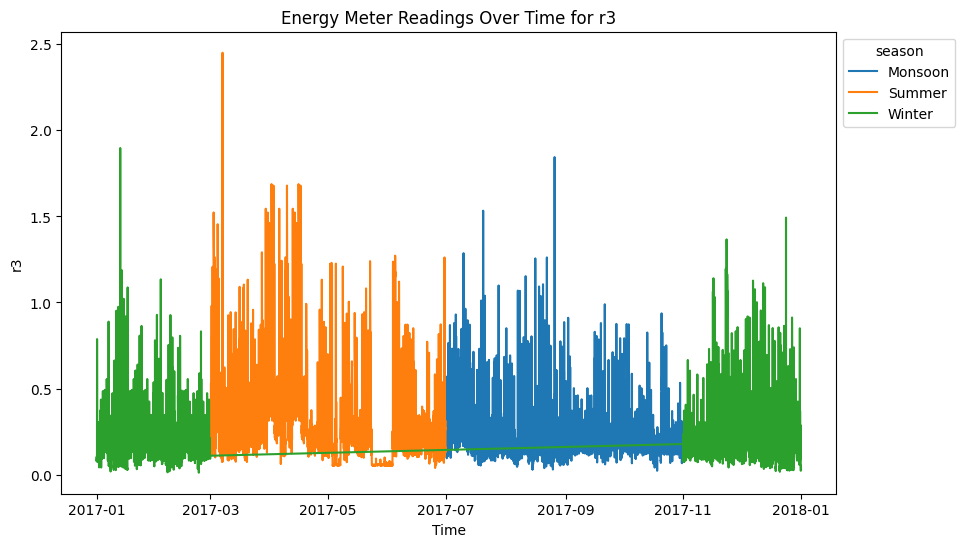

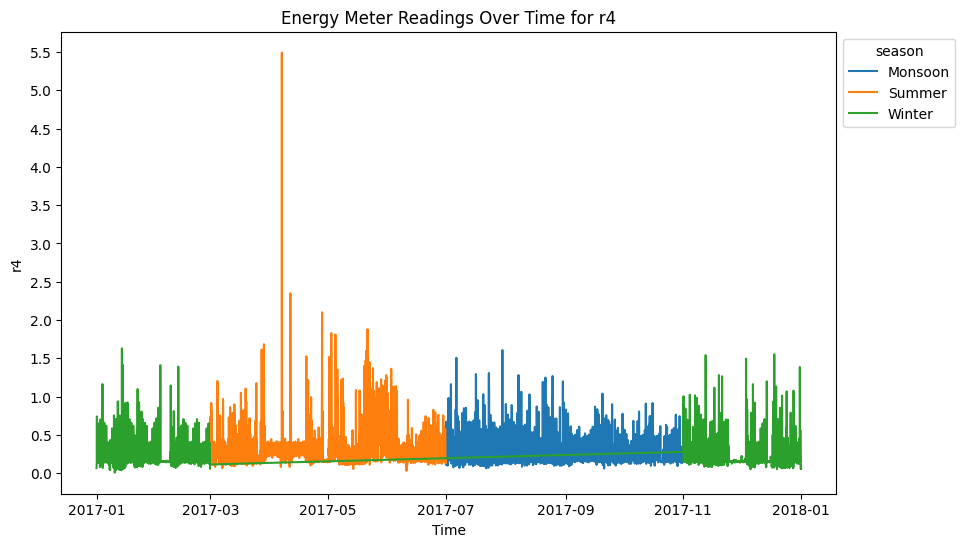

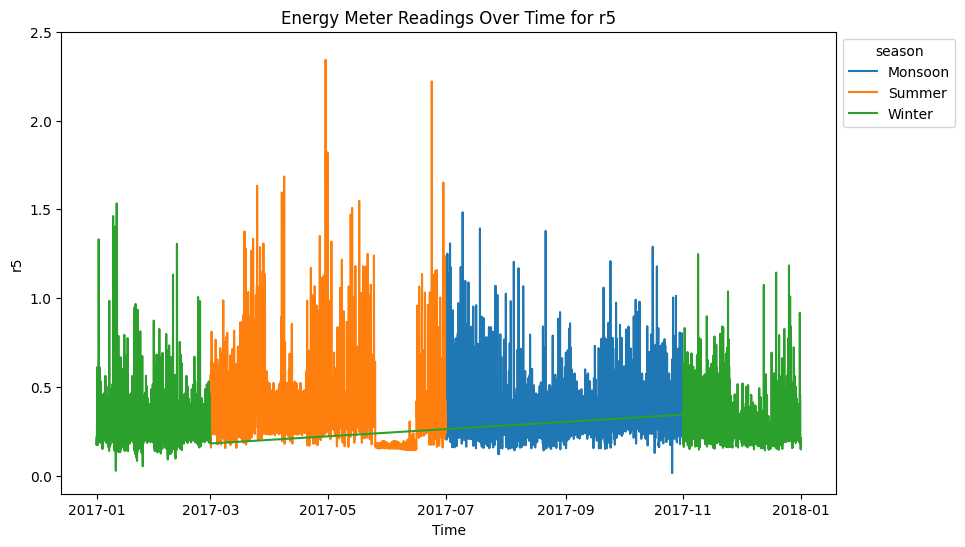

...

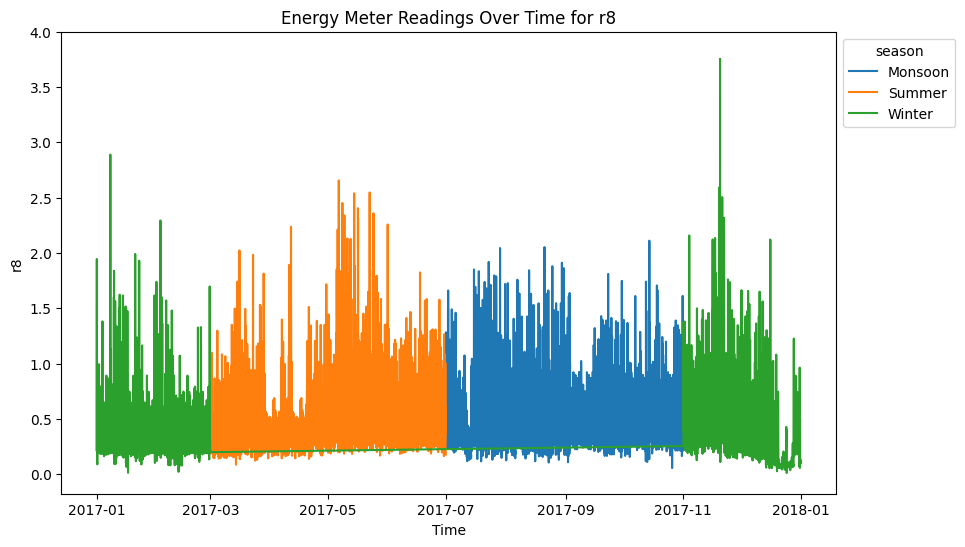

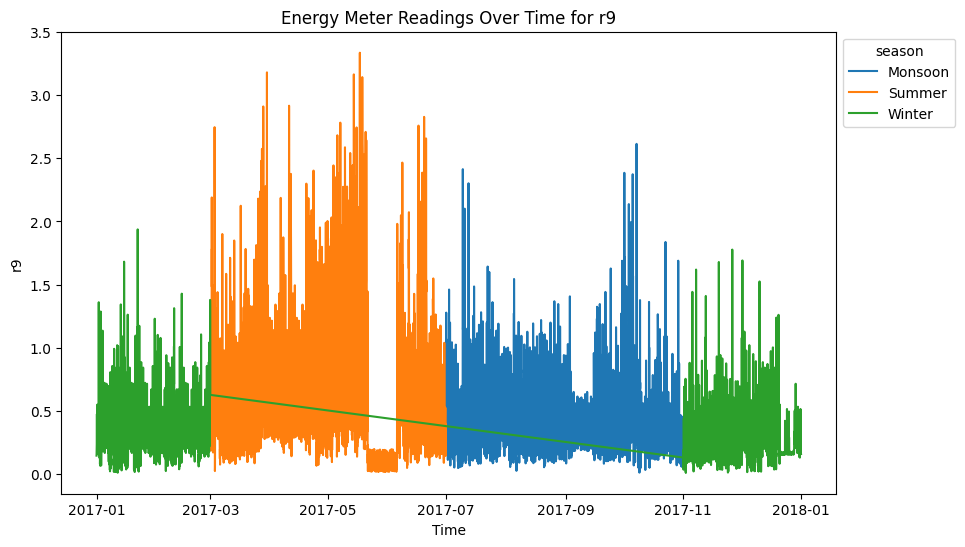

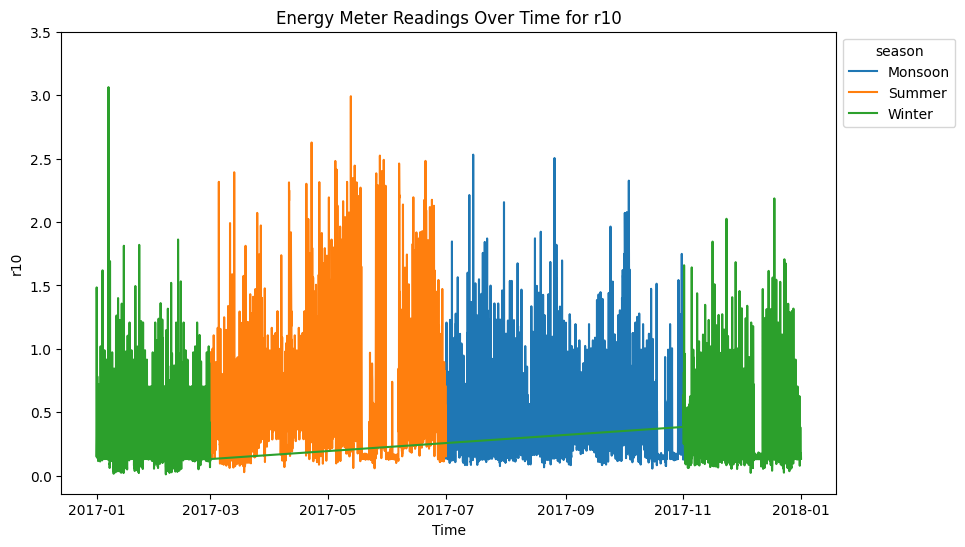

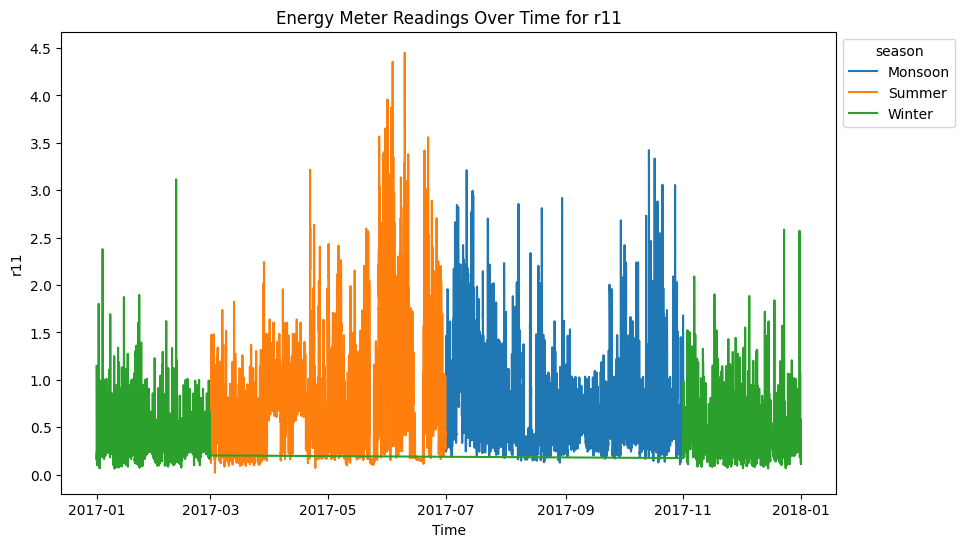

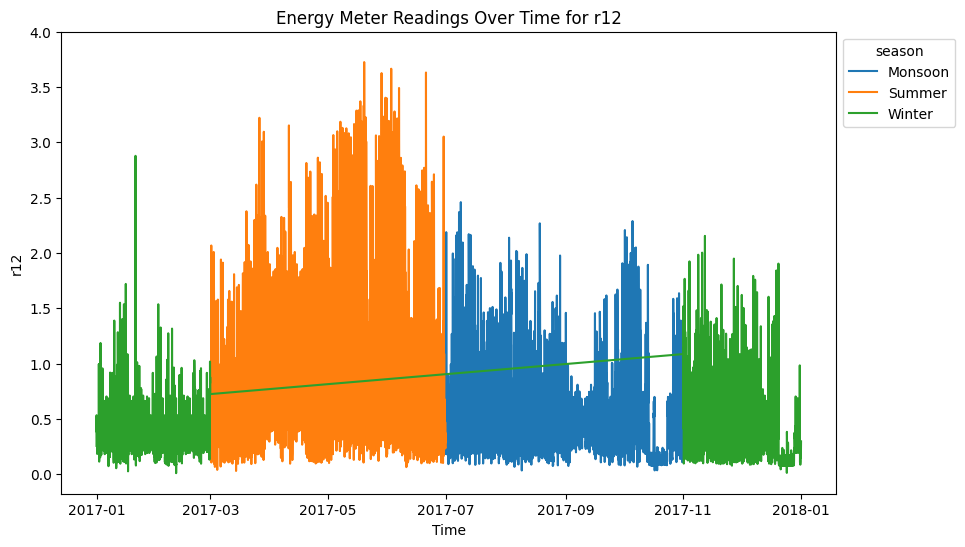

In [ ]:
for i in range(1, 13):
  plot_energy_over_time_season(i, data)

### Over different seasons

Let's plot the data by sesason for a close-up look!

In [ ]:
data['season'].unique()

array(['Winter', 'Summer', 'Monsoon'], dtype=object)

In [ ]:
# split the data into seasons
data_winter = data[data['season'] == 'Winter']
data_summer = data[data['season'] == 'Summer']
data_monsoon = data[data['season'] == 'Monsoon']

In [ ]:
# function to plot the data for each meter by season
def plot_energy_over_time_seasonal(data_season, num, season):
    plt.figure(figsize=(10, 6))  # Set the figure size
    plt.xlabel('Time')
    plt.ylabel('Energy Reading')
    plt.title(f'Energy Meter Readings Over Time for r{num} in {season}')
    plt.plot(data_season['Time'], data_season[f'r{num}'])
    plt.show()

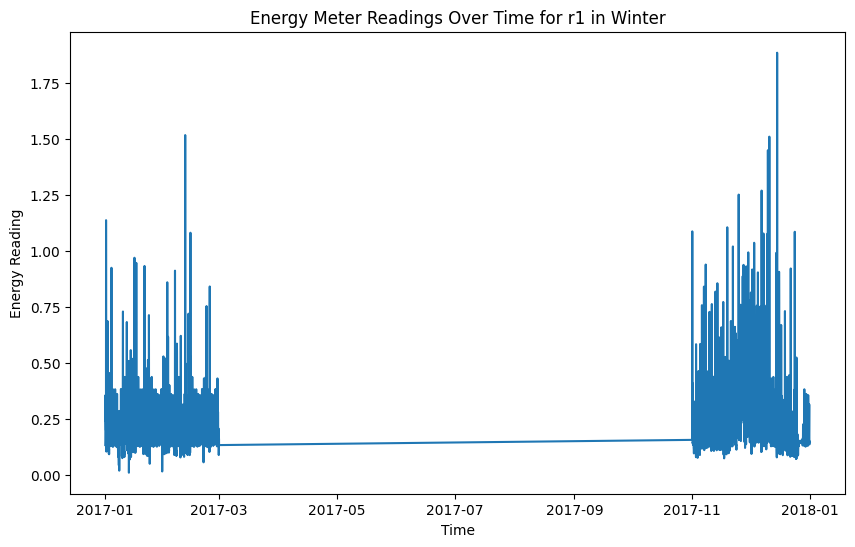

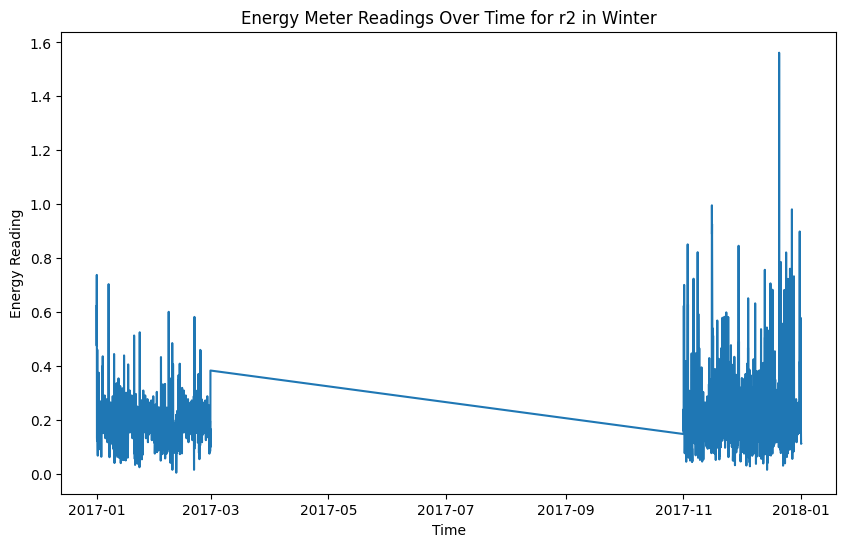

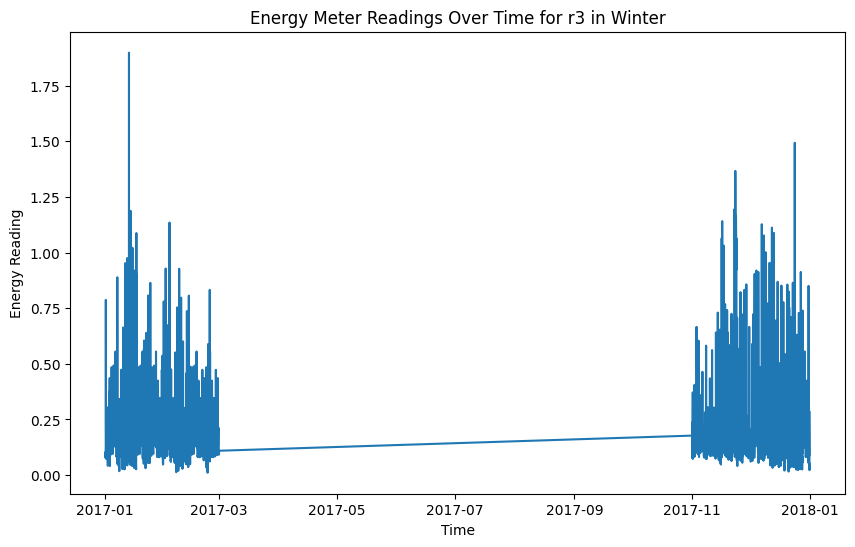

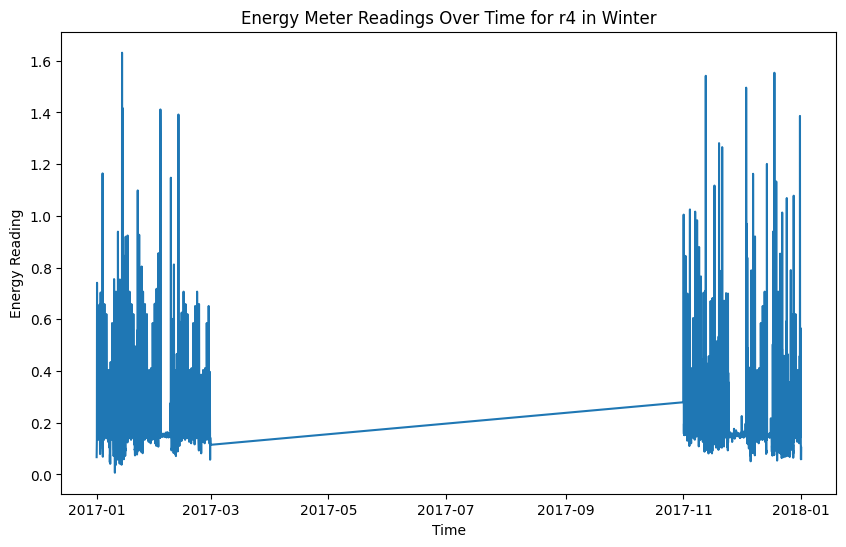

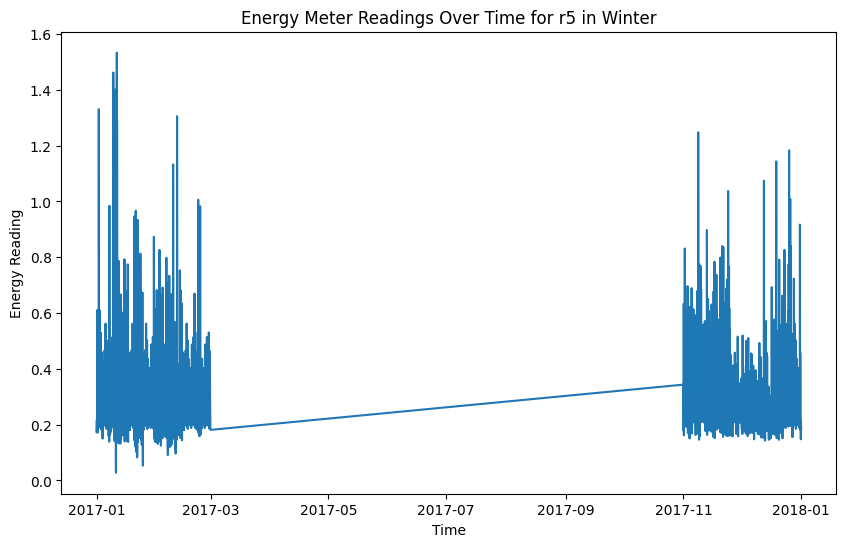

...

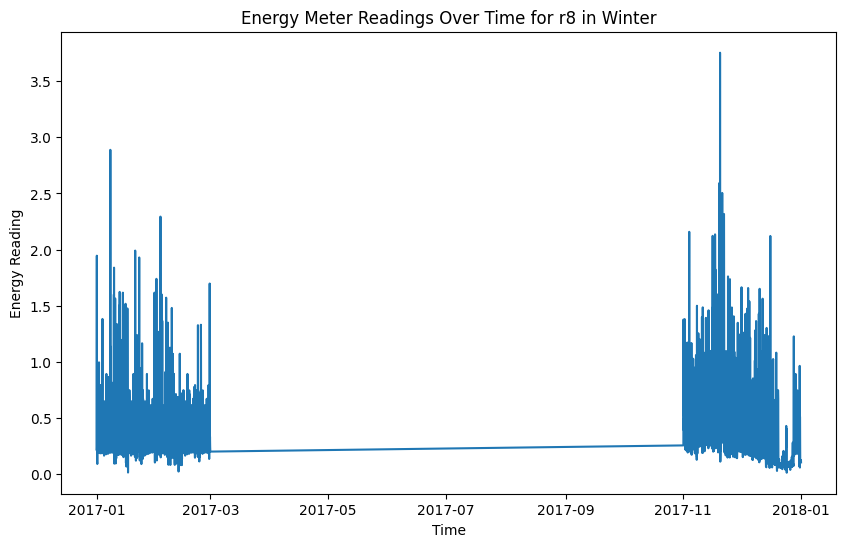

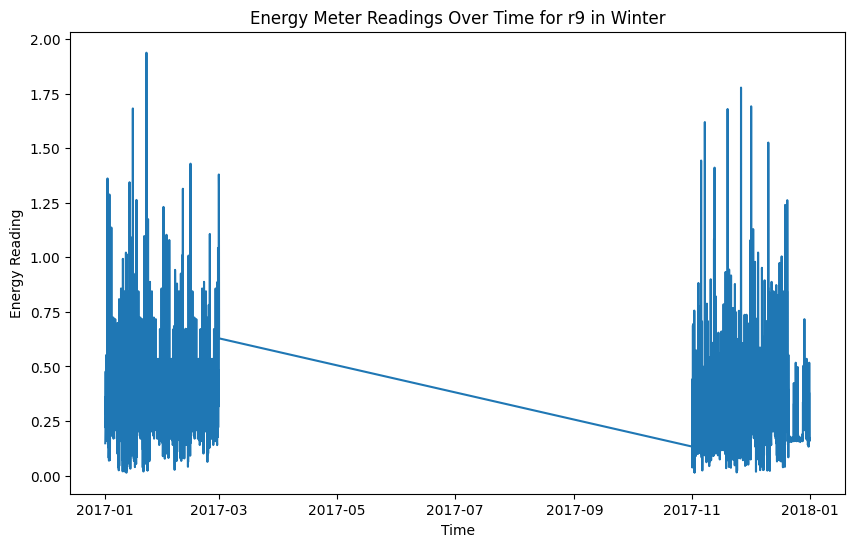

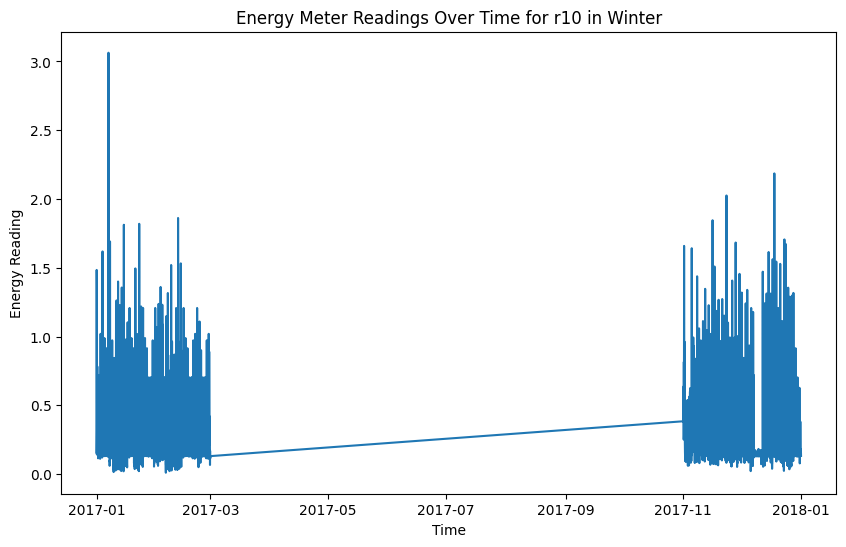

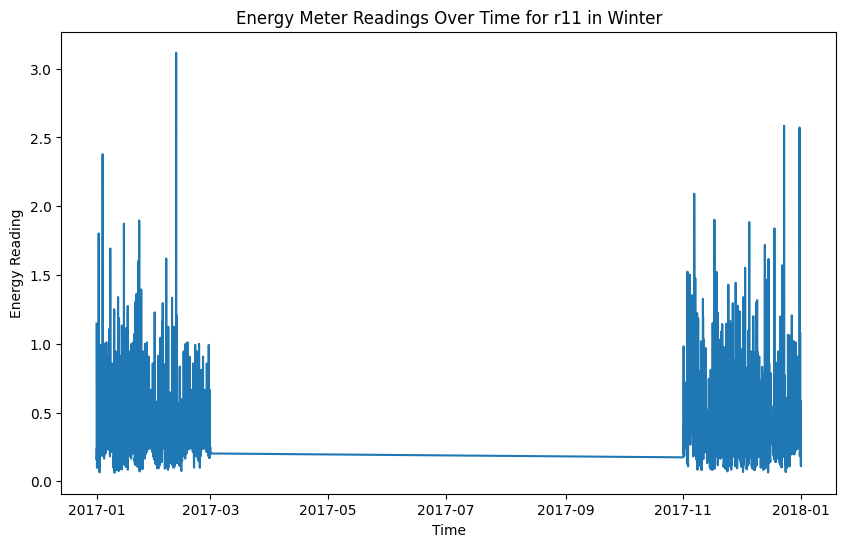

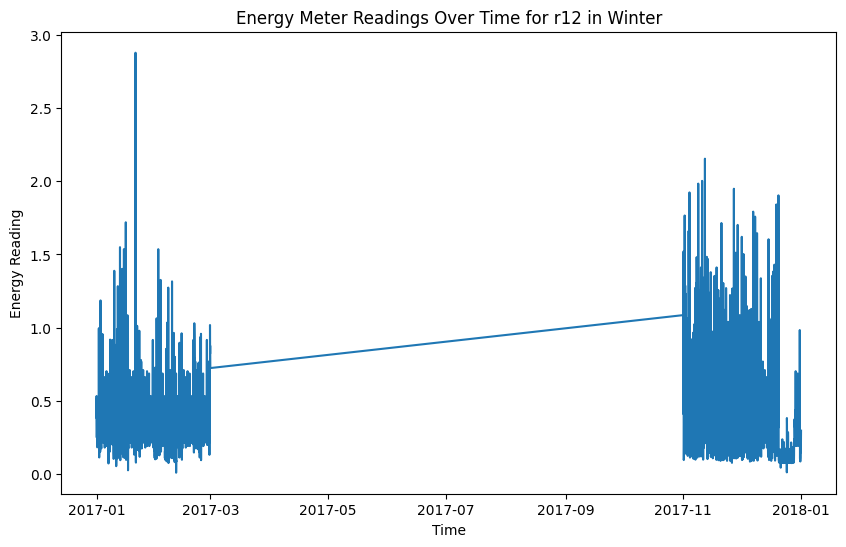

In [ ]:
# plotting winter time series
for i in range(1, 13):
    plot_energy_over_time_seasonal(data_winter, i, 'Winter')

There's a gap here which is for the other seasons. To remove this gap, we will split the winter season into the beginning of 2017 winter and the end of 2017 winter for better visualization.

In [ ]:
data_winter['moy_date'].unique()

array([ 1,  2, 11, 12])

In [ ]:
# splitting the datasets

# winter at the beginning of 2017
data_winter_17_1 = data[(data['season'] == 'Winter') & (data['year'] == 2017) & (data['moy_date'].isin([1, 2]))]

# winter at the end of 2017
data_winter_17_2 = data[(data['season'] == 'Winter') & (data['year'] == 2017) & (data['moy_date'].isin([11, 12]))]

In [ ]:
# data_winter_17_1['moy_date'].unique()
data_winter_17_2['moy_date'].unique()

array([11, 12])

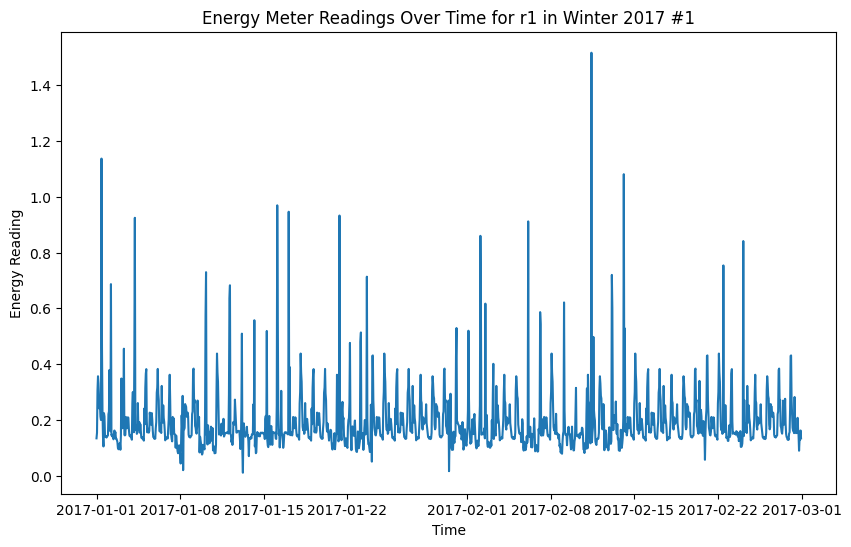

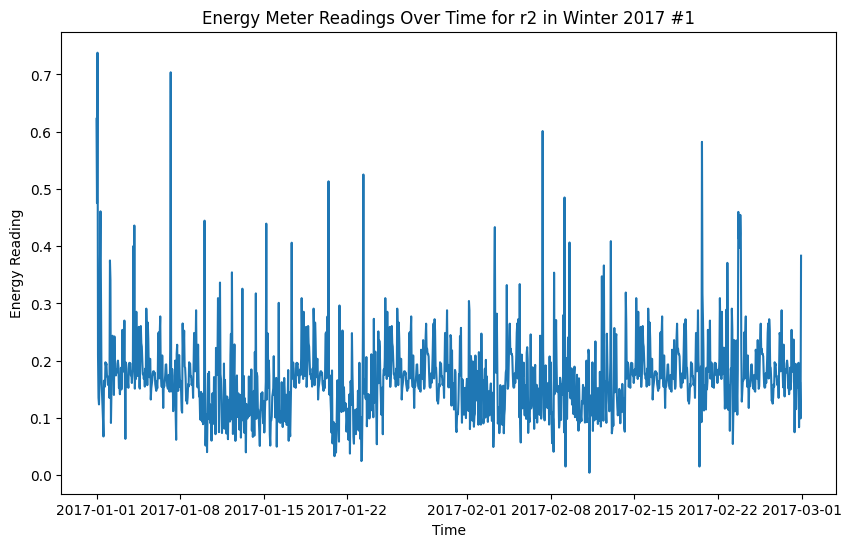

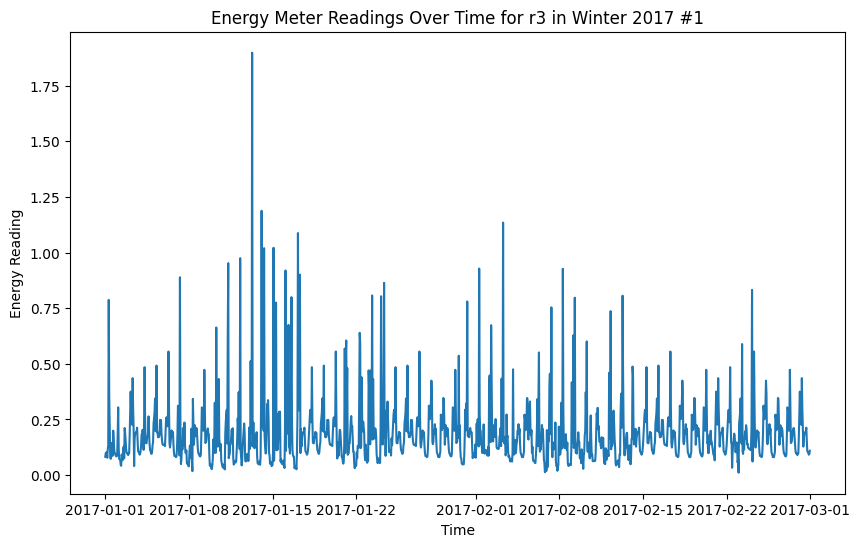

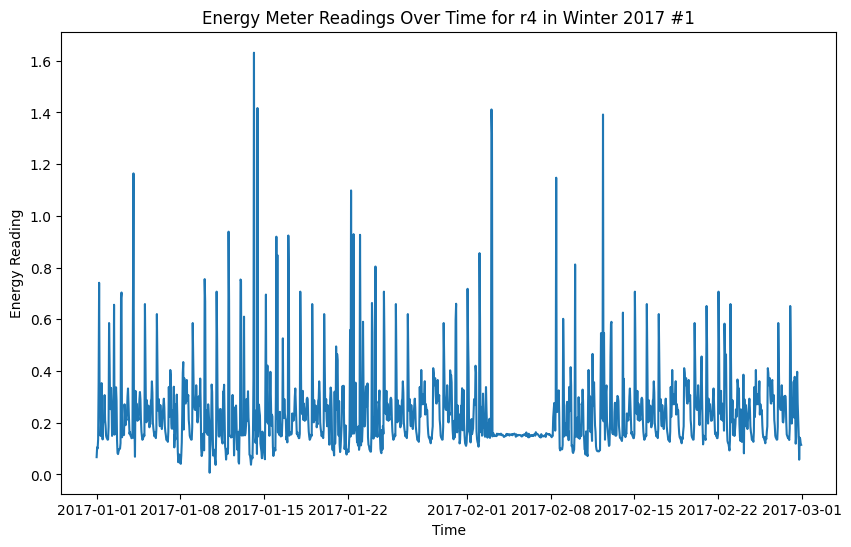

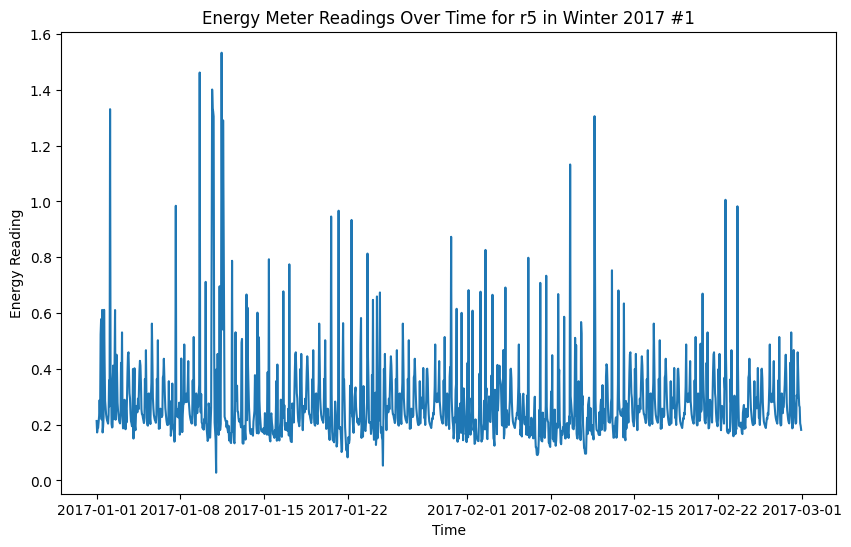

...

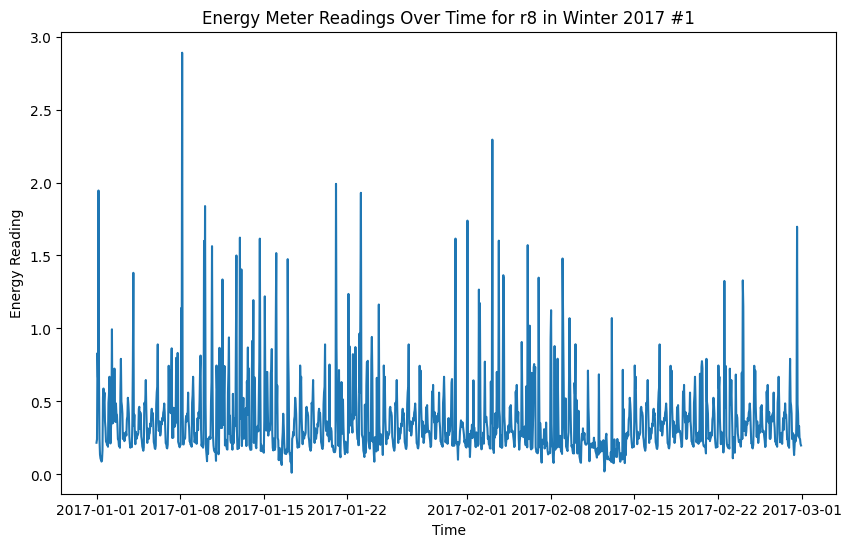

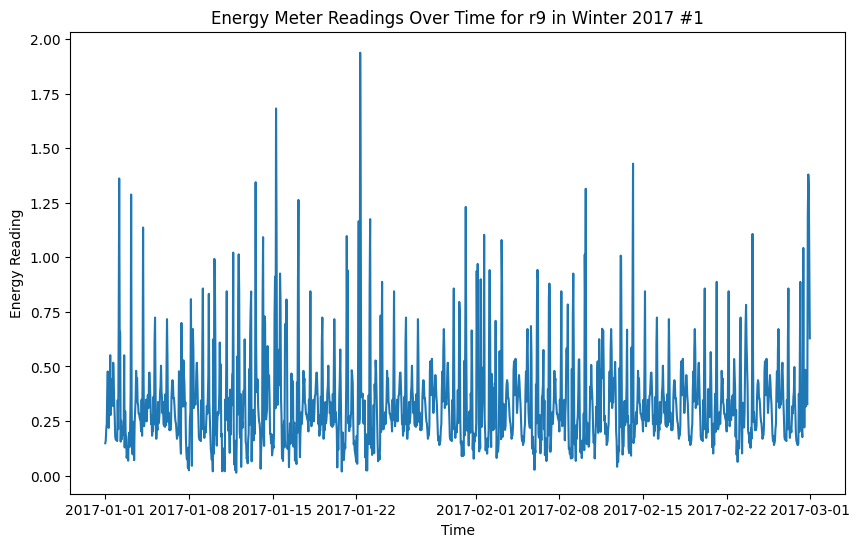

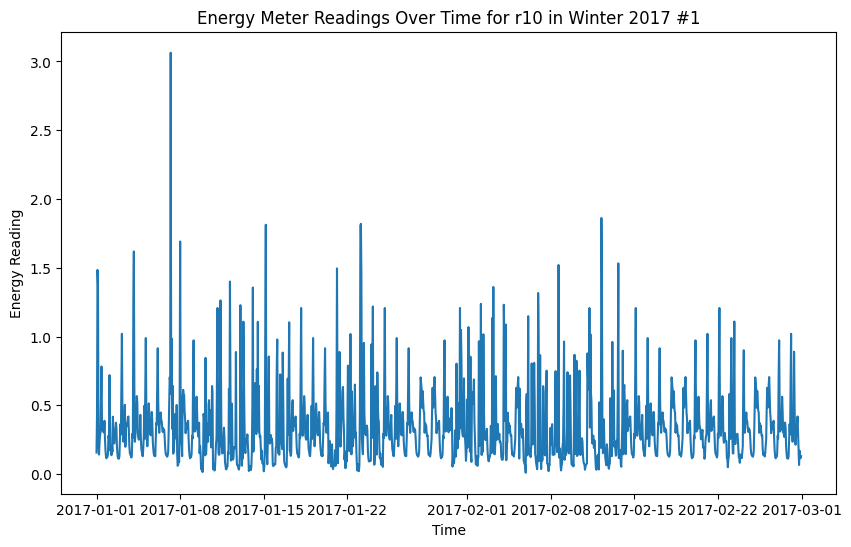

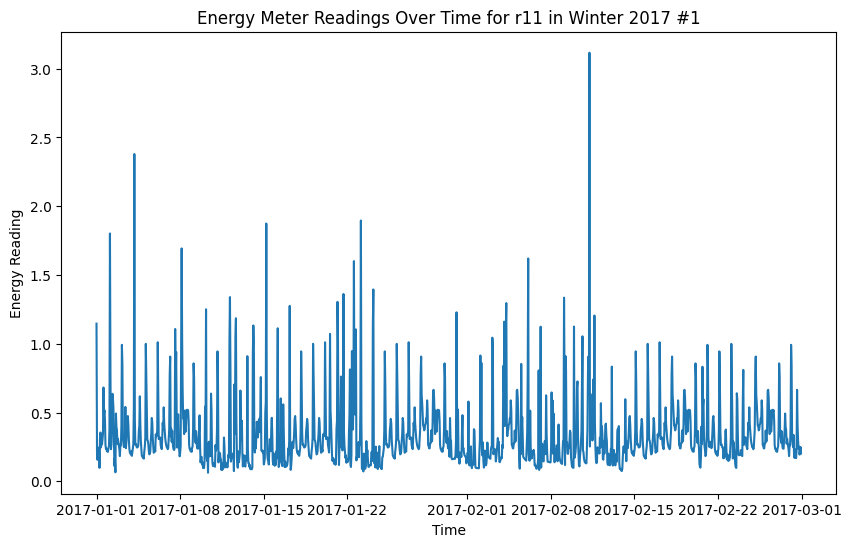

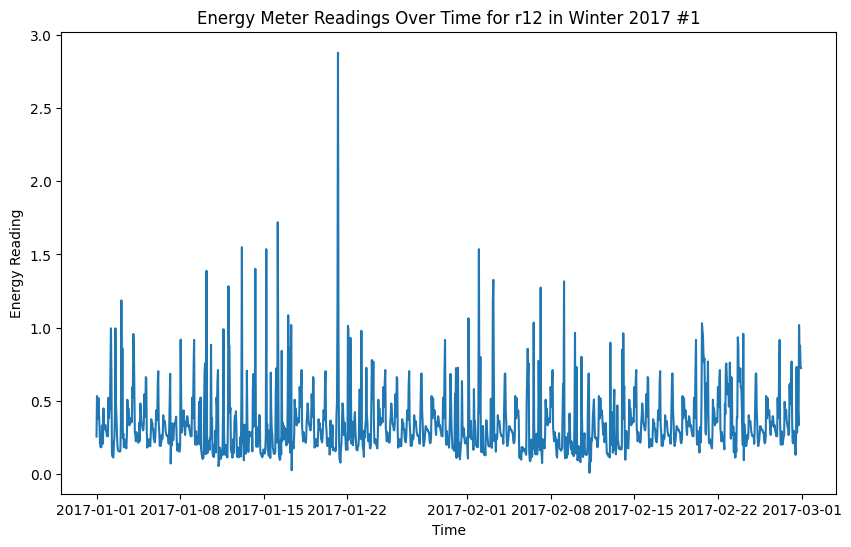

In [ ]:
# plotting winter time series for beginning of 2017
for i in range(1, 13):
    plot_energy_over_time_seasonal(data_winter_17_1, i, 'Winter 2017 #1')

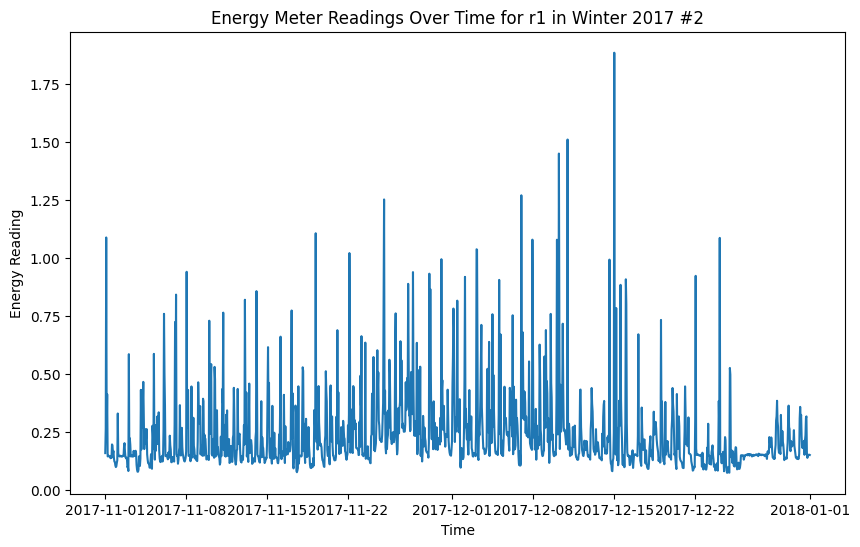

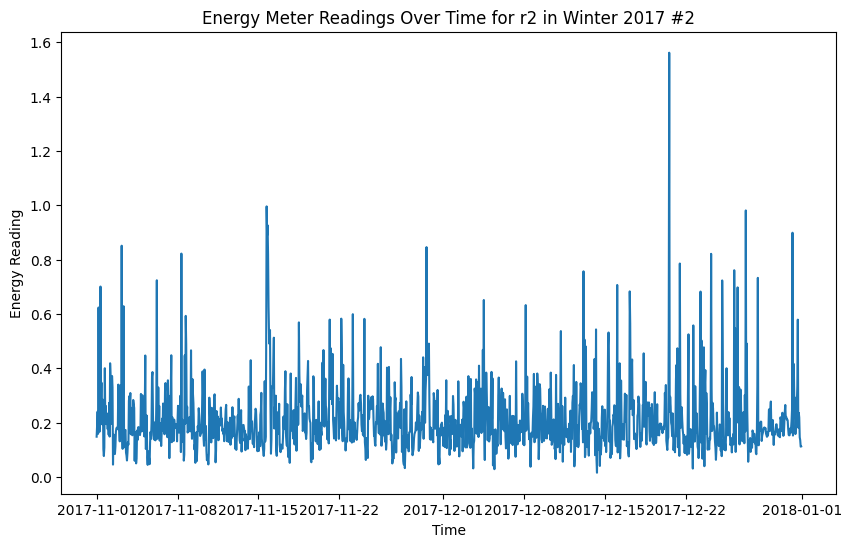

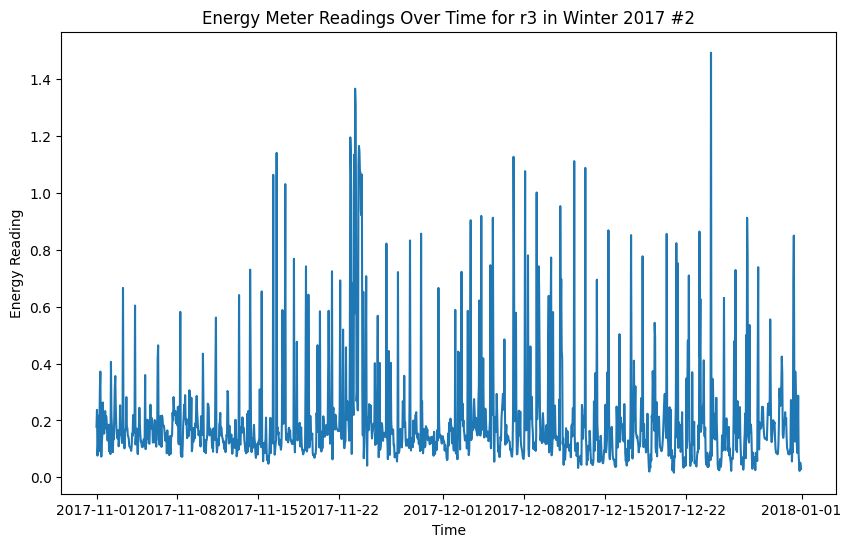

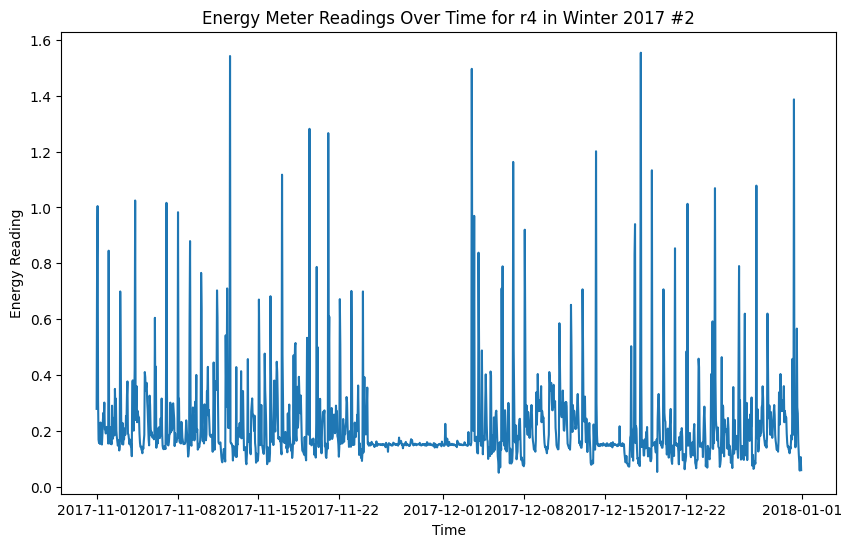

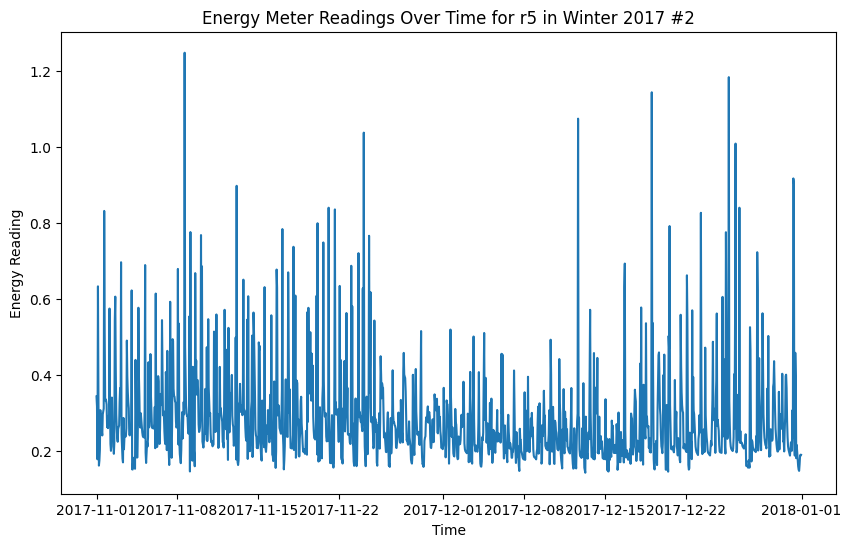

...

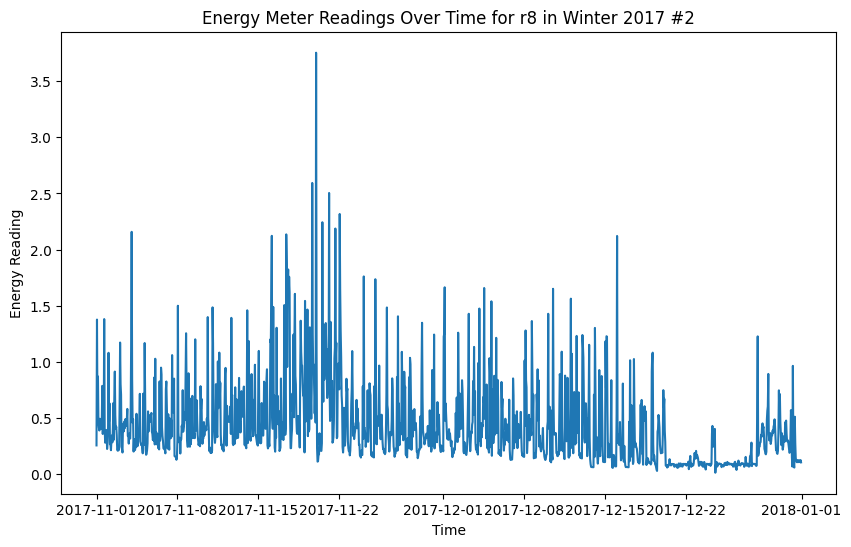

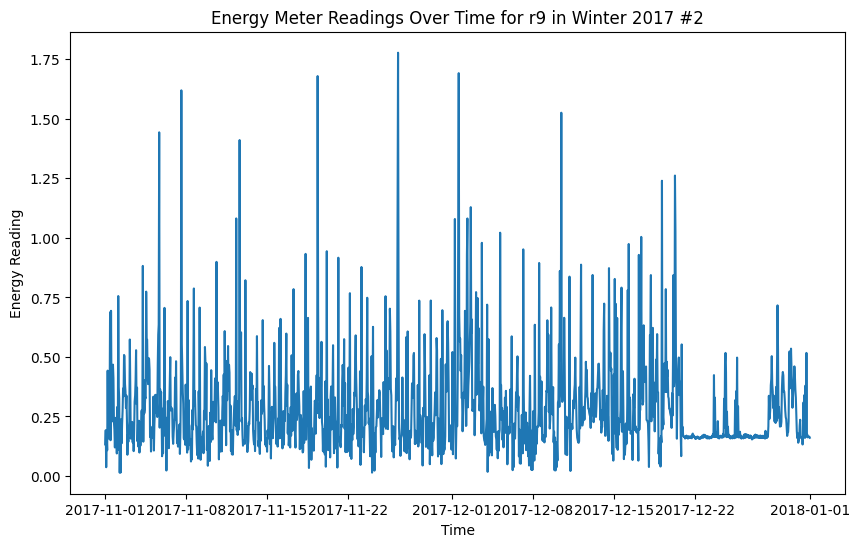

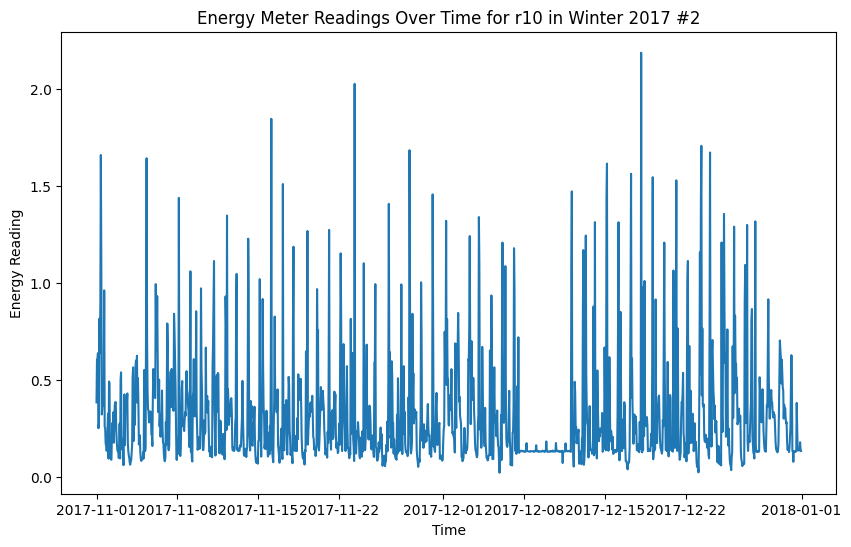

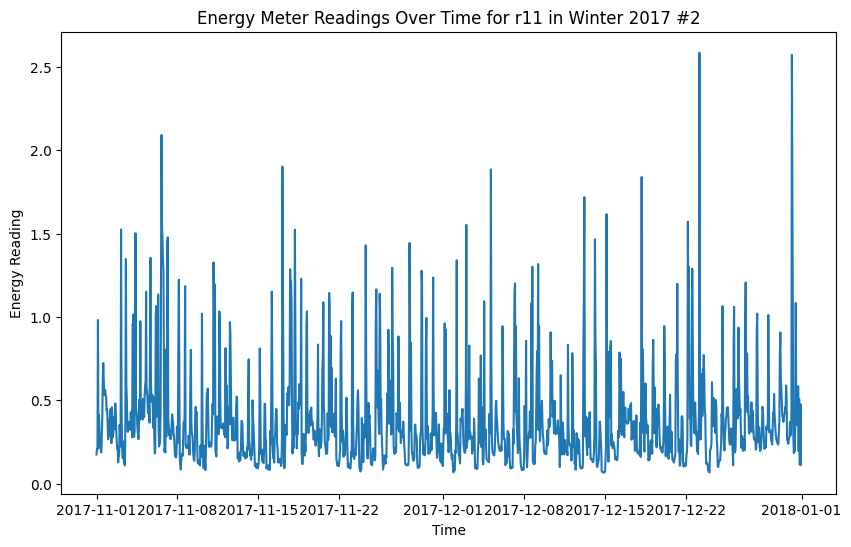

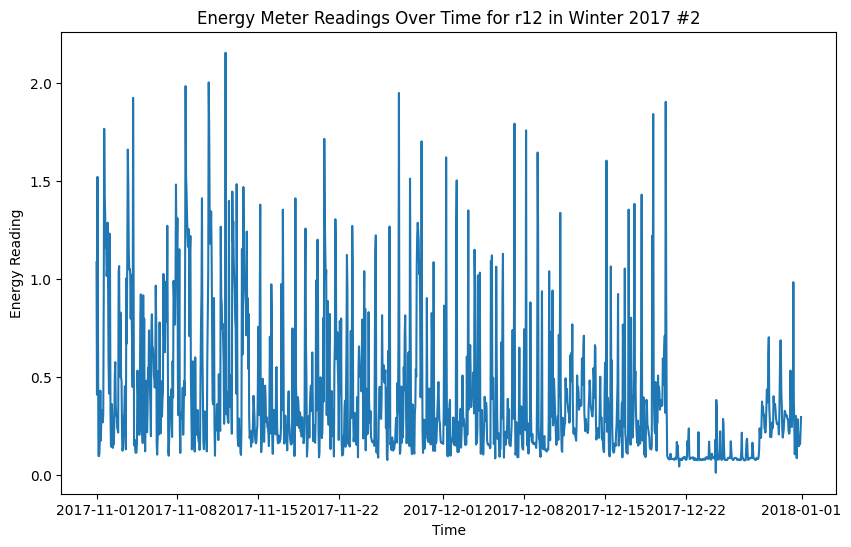

In [ ]:
# plotting winter time series for end of 2017
for i in range(1, 13):
    plot_energy_over_time_seasonal(data_winter_17_2, i, 'Winter 2017 #2')

There, the data is much more clearer. Onto the other seasons!

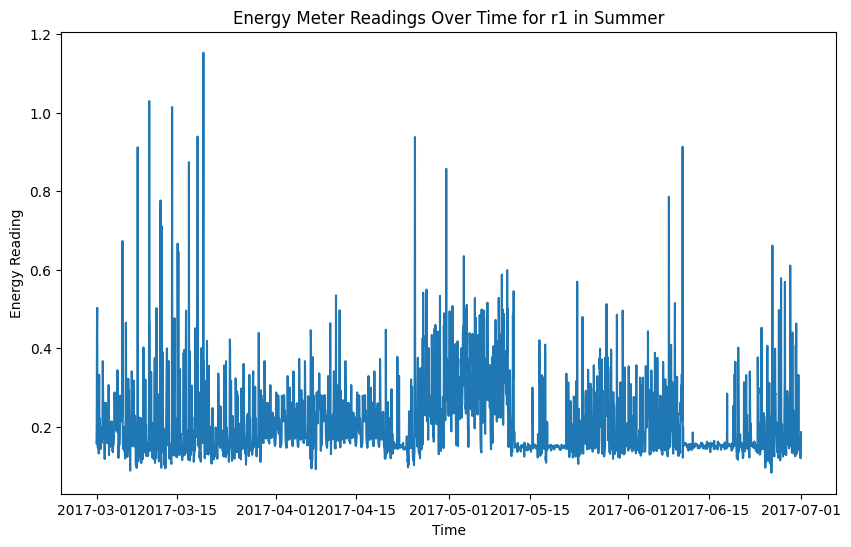

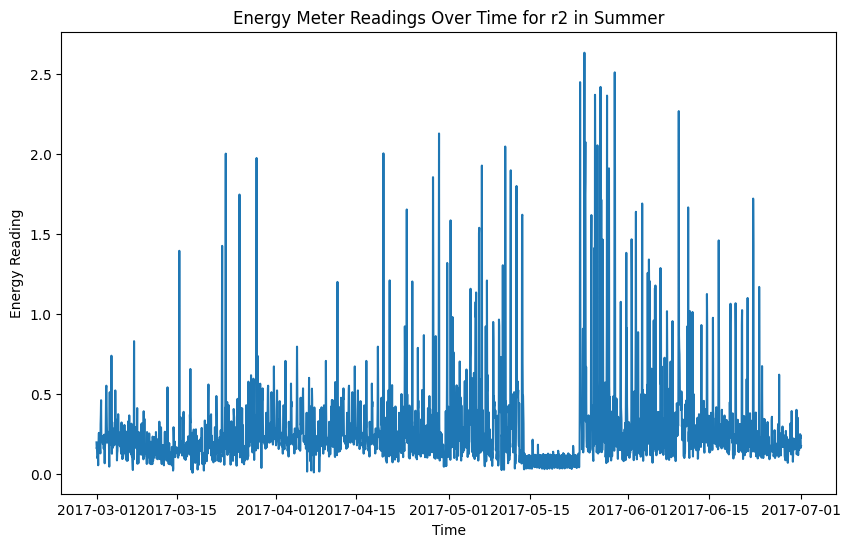

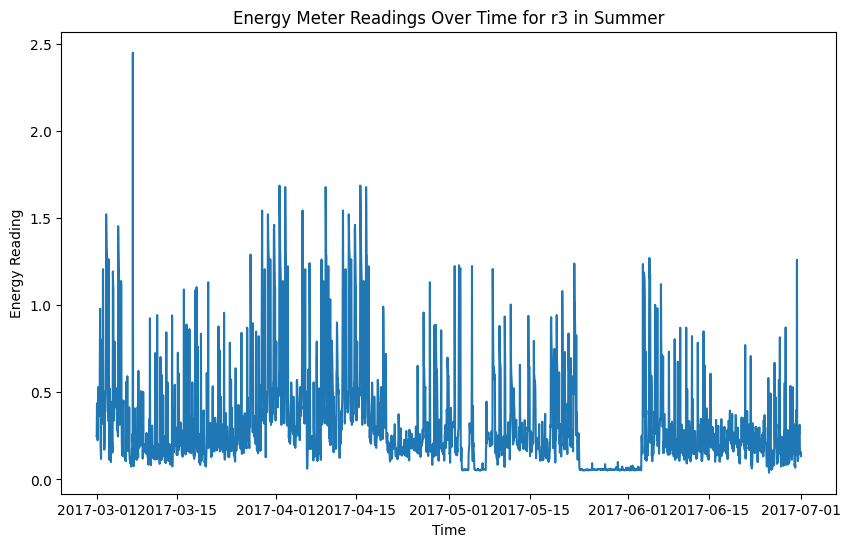

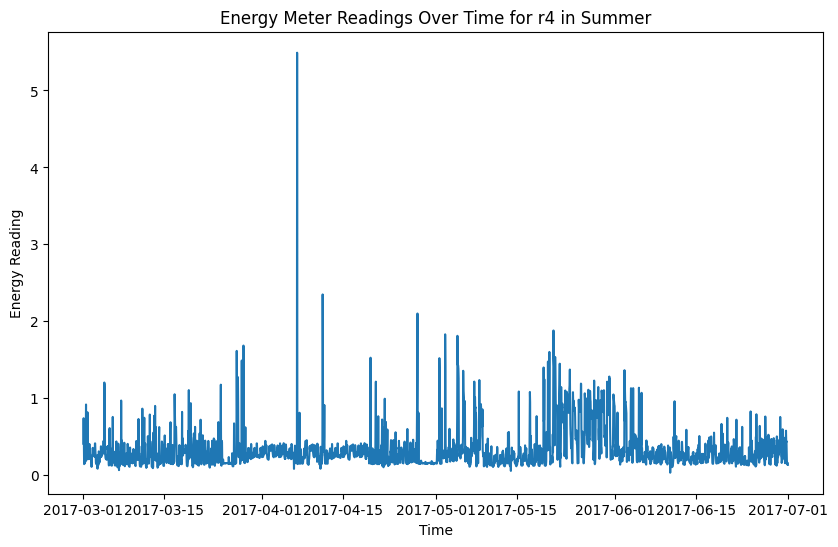

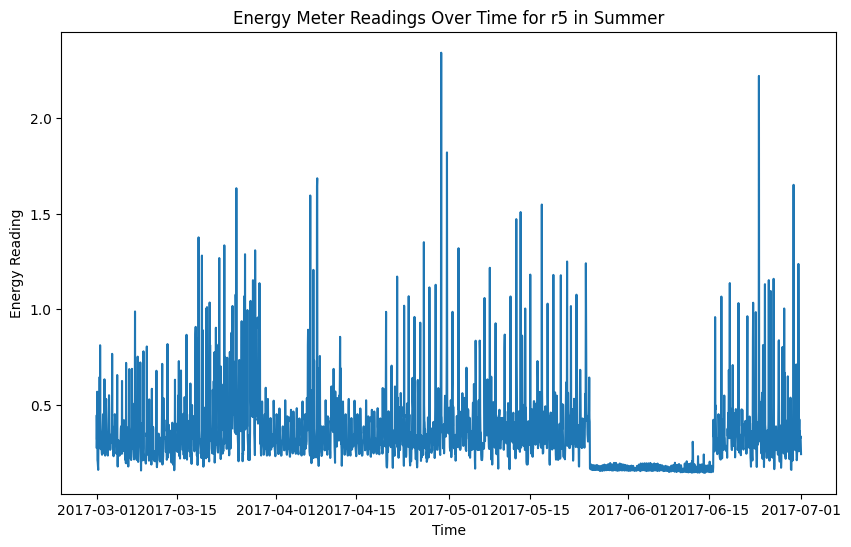

...

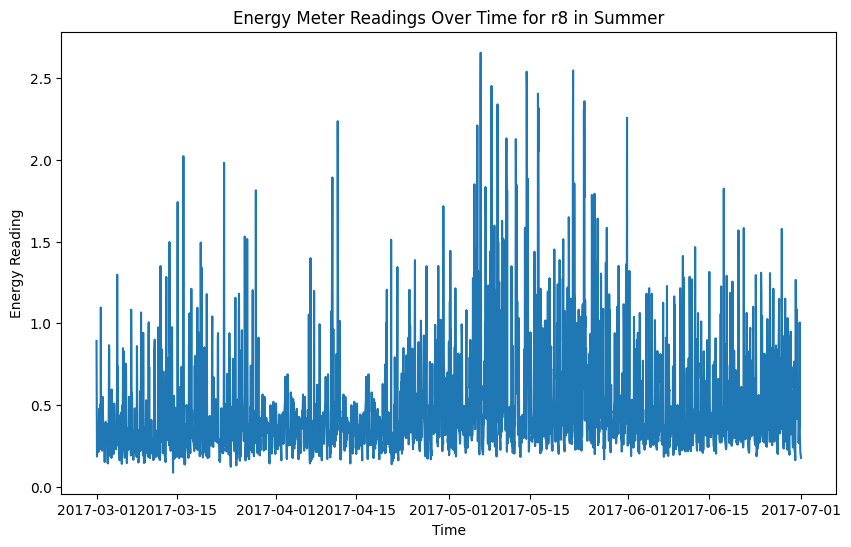

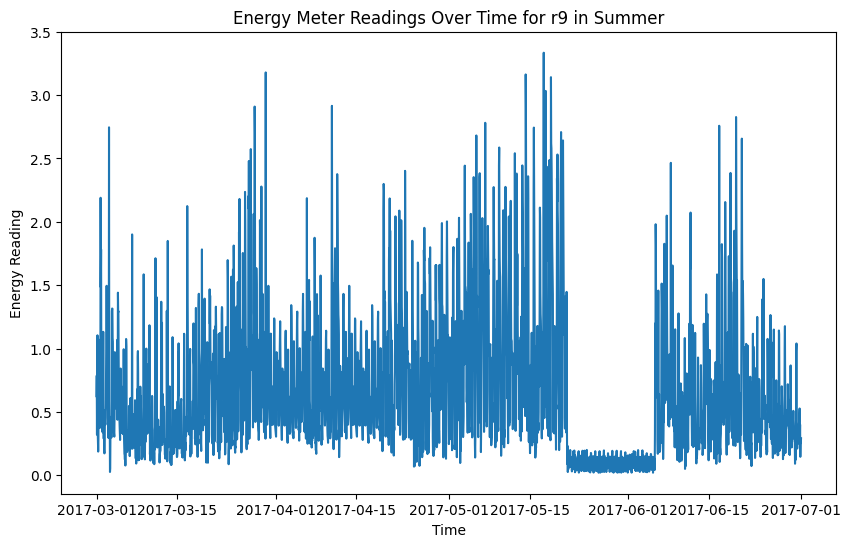

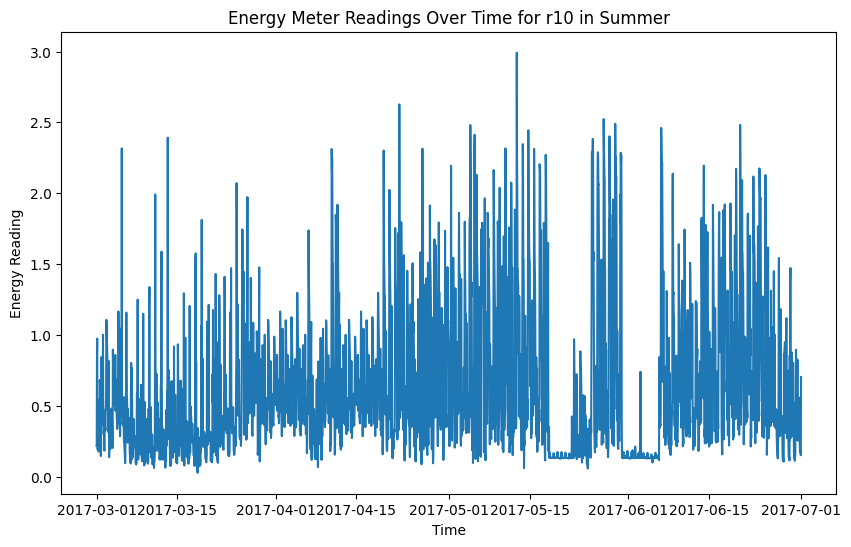

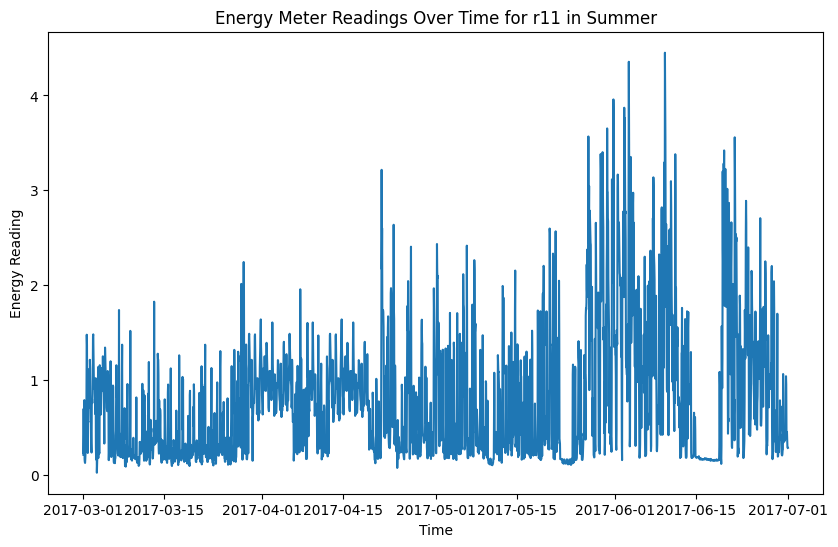

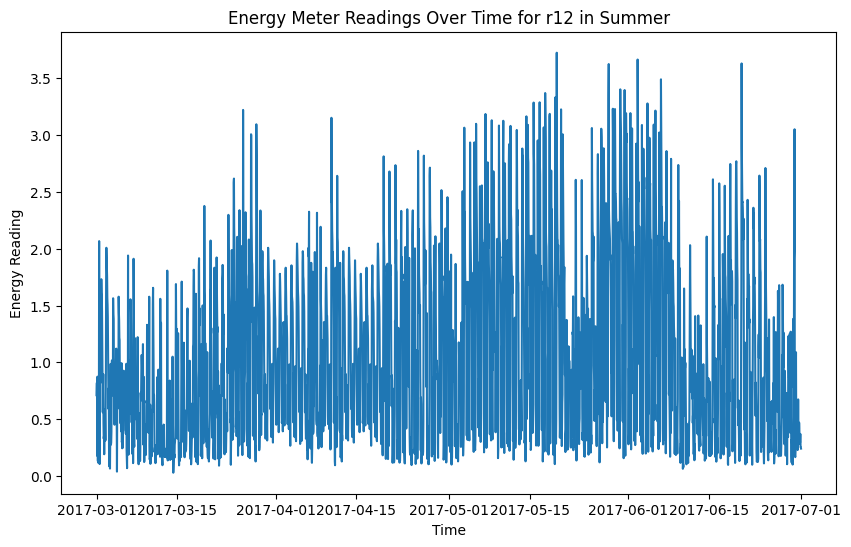

In [ ]:
# plotting summer time series
for i in range(1, 13):
    plot_energy_over_time_seasonal(data_summer, i, 'Summer')

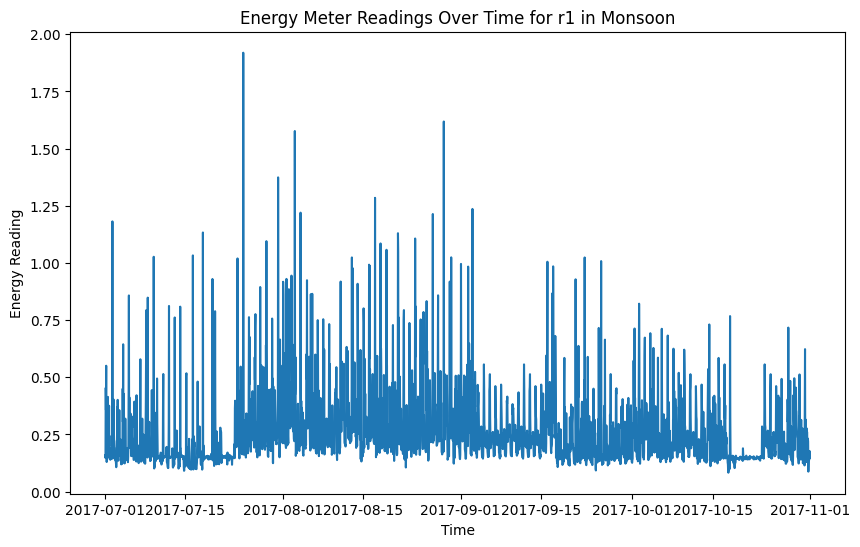

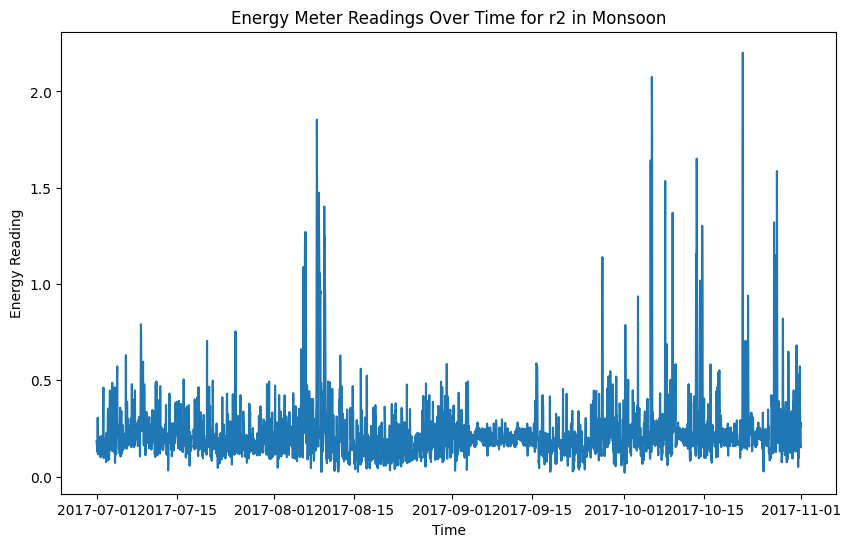

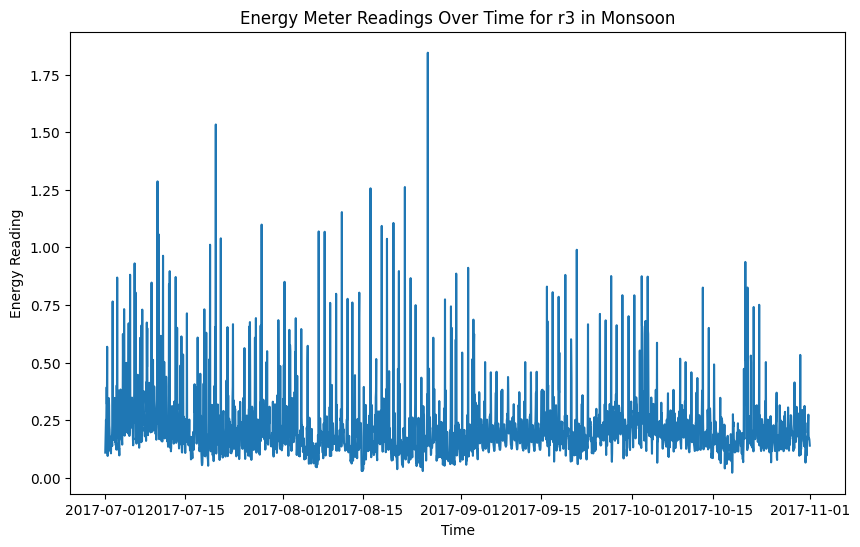

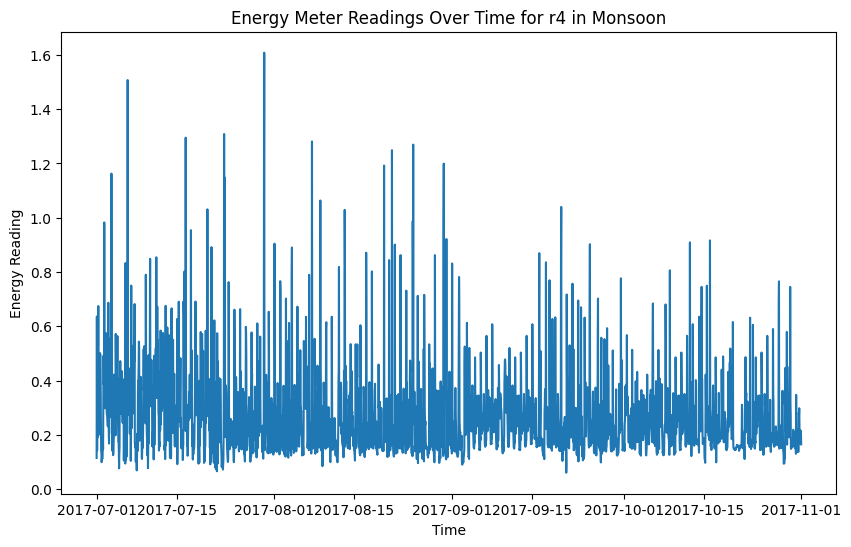

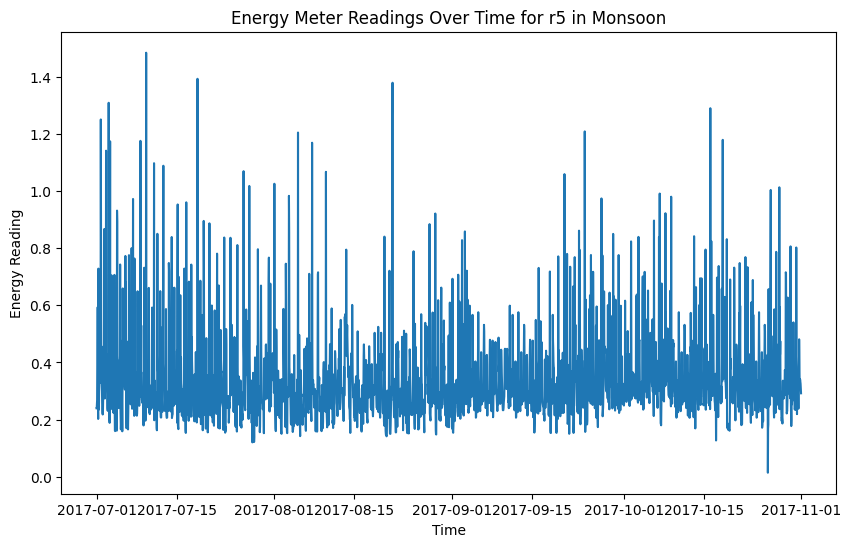

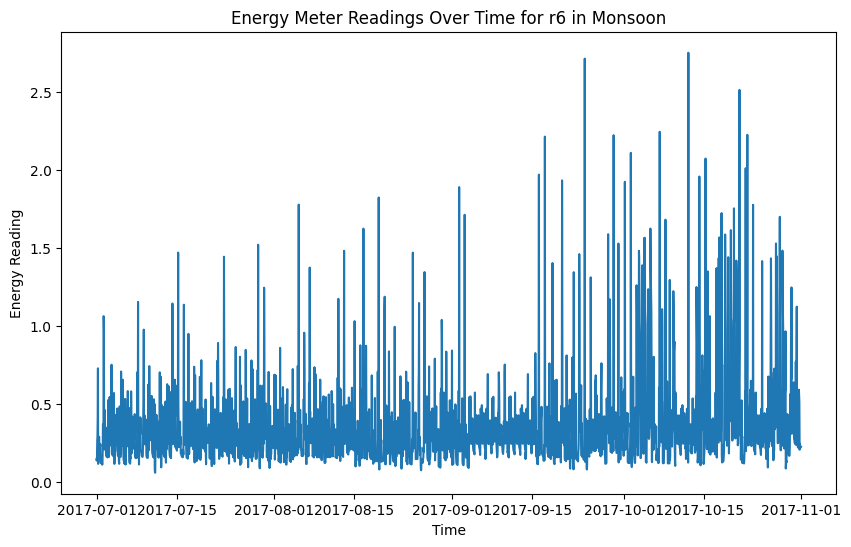

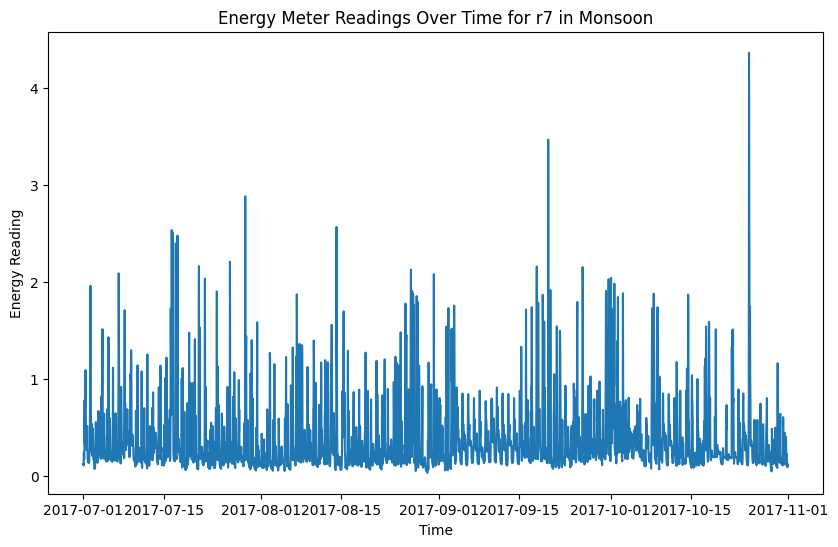

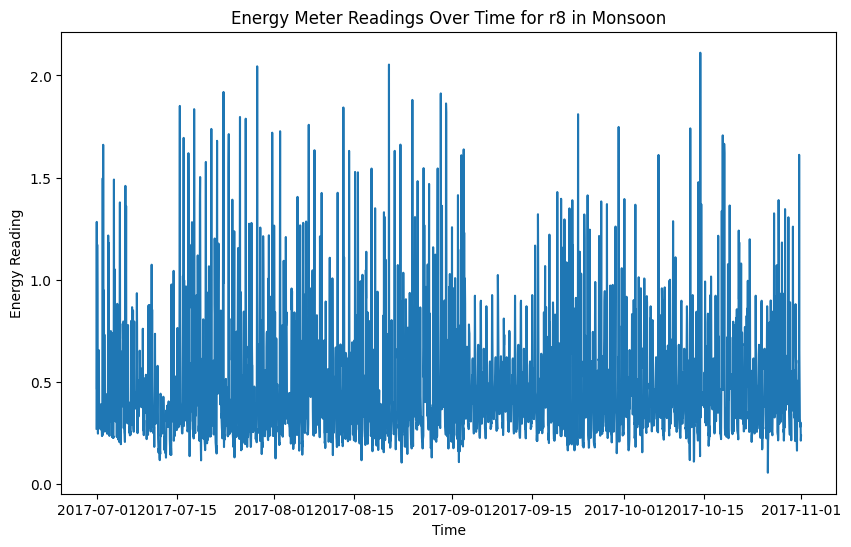

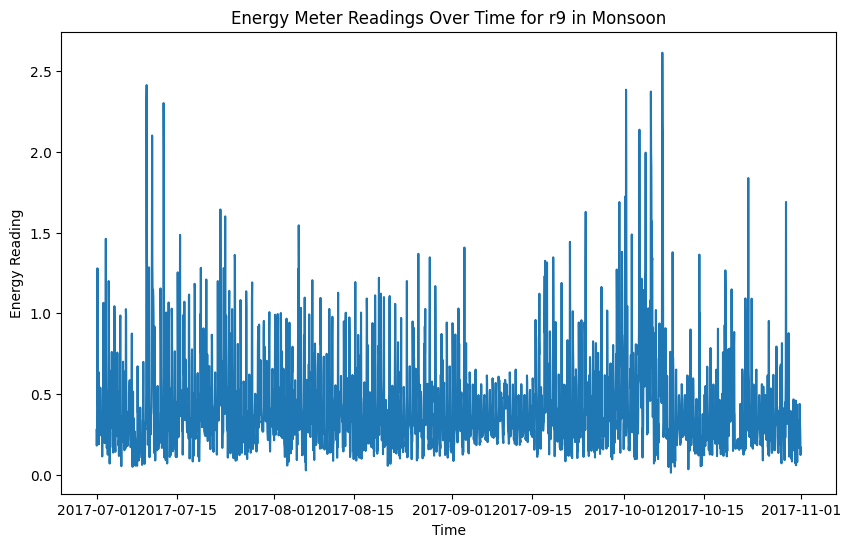

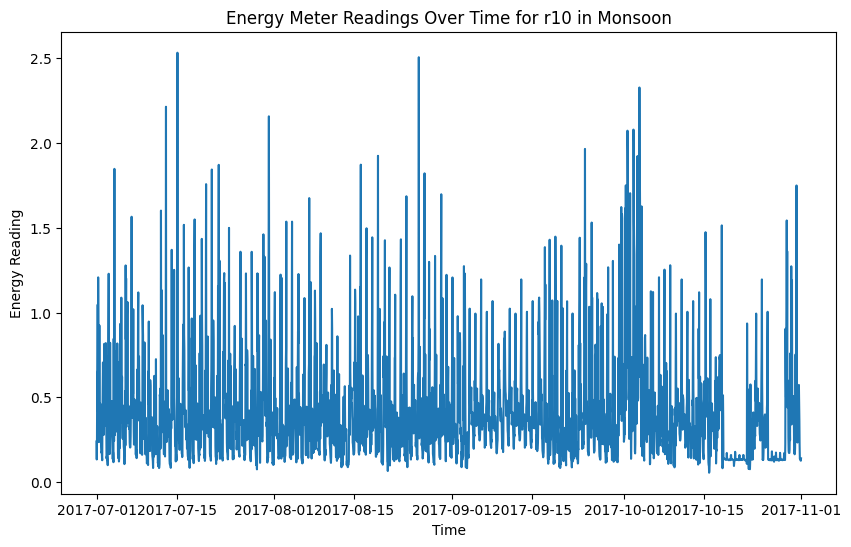

In [ ]:
# plotting monsoon time series
for i in range(1, 13):
  plot_energy_over_time_seasonal(data_monsoon, i, 'Monsoon')

  # another way to write the code on line 3
  # plot_energy_over_time_seasonal(data[data['season'].isin(['Monsoon'])], i, 'Monsoon')

We see that summer causes the meters to have a higher reading as compared to winter and monosoon.

NOTE: There is another way to write this code by invoking the season condition while plotting instead of creating separate dataframes for each season. It is better to define separate dataframes for cleanness of the data for modularity.

### Busy day or not?

What exactly is busy day? Let's try to find this out from plotting the data.

In [ ]:
busy = data['busday'].unique()
busy

False = not a busy day\
True = busy day\
Got it.

In [ ]:
data_busy = data[data['busday'] == True]
data_not_busy = data[data['busday'] == False]

In [ ]:
data_busy

In [ ]:
# function to plot the data of all time, color coded according to season, for each meter
def plot_energy_over_time_season(num, data):
  plt.figure(figsize=(10, 6))

  df_sorted = data.sort_values('Time', ascending=True)

  # is_busy_ = 'Busy' if df_sorted[df_sorted['busday'] == True] else 'Not Busy'
  is_busy = "Busy" if any(df_sorted['busday']) else "Not Busy"


  # group by season and plot each season's data in a different color
  # treat every season as a separate series, but plot on the same graph
  for i, (series_name, series) in enumerate(df_sorted.groupby('season')):

    # palette = list(sns.palettes.mpl_palette('Dark2')) # can use this for a different color palette
    xs = series['Time']
    ys = series[f'r{num}']

    # plot each season's series
    plt.plot(xs, ys, label=series_name) #, color=palette[i % len(palette)]) # include the color parameter to invoke the palette defined in line 7

  plt.legend(title='season', bbox_to_anchor=(1, 1), loc='upper left')

  # determine the maximum y value for the y ticks

  # y_min = df_sorted[f'r{num}'].min() # not needed, we can simply use 0 as the minimum for a cleaner look
  y_max = df_sorted[f'r{num}'].max()
  y_max_adjusted = np.ceil(y_max / 0.5) * 0.5 # round up to the nearest integer and then multiple of 0.5

  # for ensuring uniformity in y ticks across meters
  y_ticks = np.arange(0, y_max_adjusted + 0.5, 0.5) # can adjust the step as per requirements
  plt.yticks(y_ticks)

  plt.xlabel('Time')
  plt.ylabel(f'r{num}')
  plt.title(f'Energy Meter Readings Over Time for r{num} when {is_busy}')
  plt.show()

In [ ]:
for i in range(1, 13):
  plot_energy_over_time_season(i, data_busy)

In [ ]:
for i in range(1, 13):
  plot_energy_over_time_season(i, data_not_busy)

In [ ]:
columns = [f'r{i}' for i in range(1, 13)]
busy_avg = data.groupby('busday')[columns].mean()
busy_avg

In [ ]:
busy_count = data['busday'].value_counts()[True]
non_busy_count = data['busday'].value_counts()[False]
print(f"Number of busy days: {busy_count}")
print(f"Number of non-busy days: {non_busy_count}")

Looks like busy day doesn't signify any difference in energy meter values. It could perhaps be a business holiday.

We can also plot the entire data and color code it according to busyness.

In [ ]:
# function to plot the data of all time, color coded according to season, for each meter
def plot_energy_over_time_busy(num, data):
  plt.figure(figsize=(10, 6))

  df_sorted = data.sort_values('Time', ascending=True)

  # is_busy_ = 'Busy' if df_sorted[df_sorted['busday'] == True] else 'Not Busy'
  # is_busy = "Busy" if any(df_sorted['busday']) else "Not Busy"


  # group by season and plot busy and non busy data in a different color
  # treat busy and non busy as separate series, but plot on the same graph
  for i, (series_name, series) in enumerate(df_sorted.groupby('busday')):

    # palette = list(sns.palettes.mpl_palette('Dark2')) # can use this for a different color palette
    xs = series['Time']
    ys = series[f'r{num}']

    # plot each season's series
    plt.plot(xs, ys, label=series_name) #, color=palette[i % len(palette)]) # include the color parameter to invoke the palette defined in line 7

  plt.legend(title='Busy or not?', bbox_to_anchor=(1, 1), loc='upper left')

  # determine the maximum y value for the y ticks

  # y_min = df_sorted[f'r{num}'].min() # not needed, we can simply use 0 as the minimum for a cleaner look
  y_max = df_sorted[f'r{num}'].max()
  y_max_adjusted = np.ceil(y_max / 0.5) * 0.5 # round up to the nearest integer and then multiple of 0.5

  # for ensuring uniformity in y ticks across meters
  y_ticks = np.arange(0, y_max_adjusted + 0.5, 0.5) # can adjust the step as per requirements
  plt.yticks(y_ticks)

  plt.xlabel('Time')
  plt.ylabel(f'r{num}')
  plt.title(f'Energy Meter Readings Over Time for r{num}')
  plt.show()

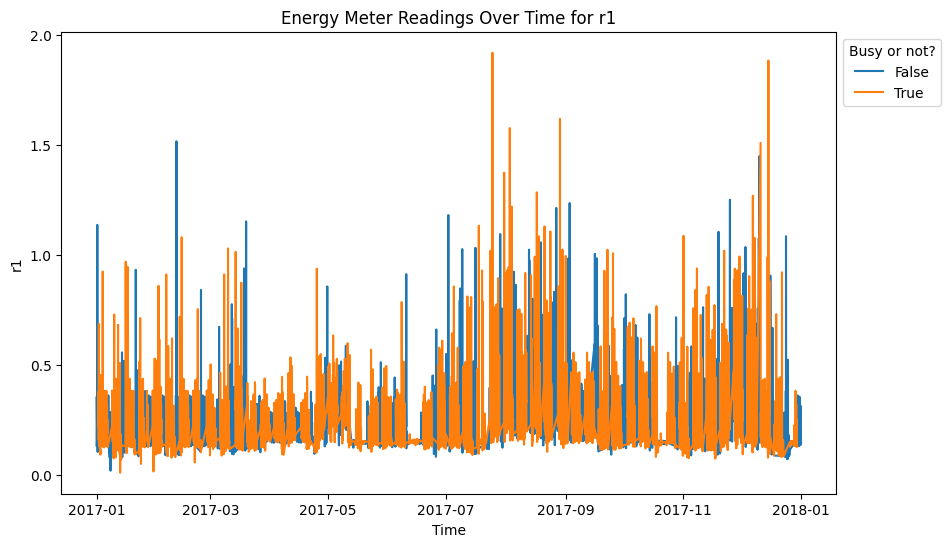

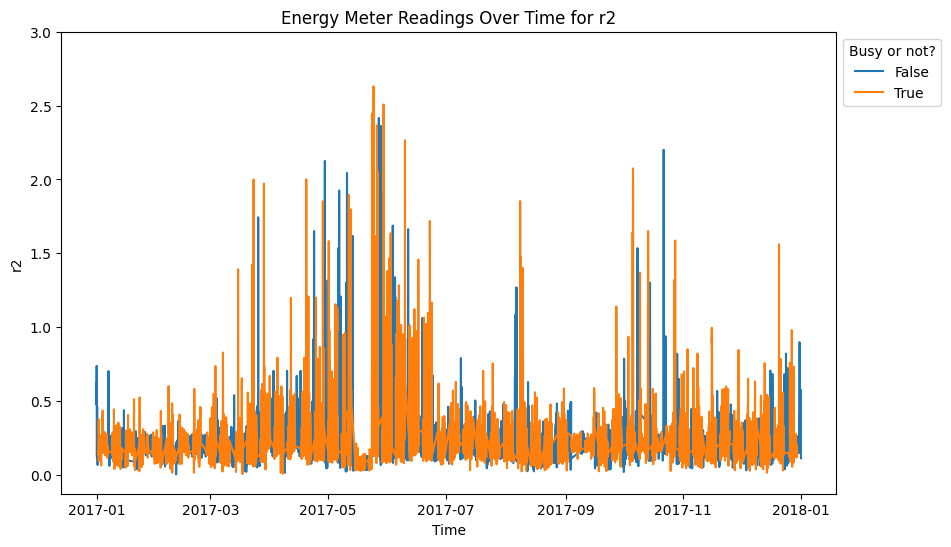

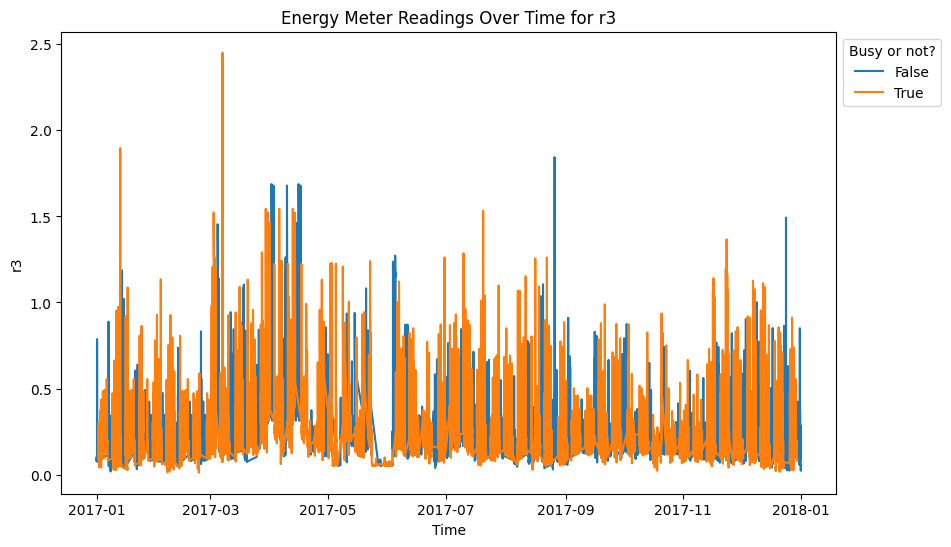

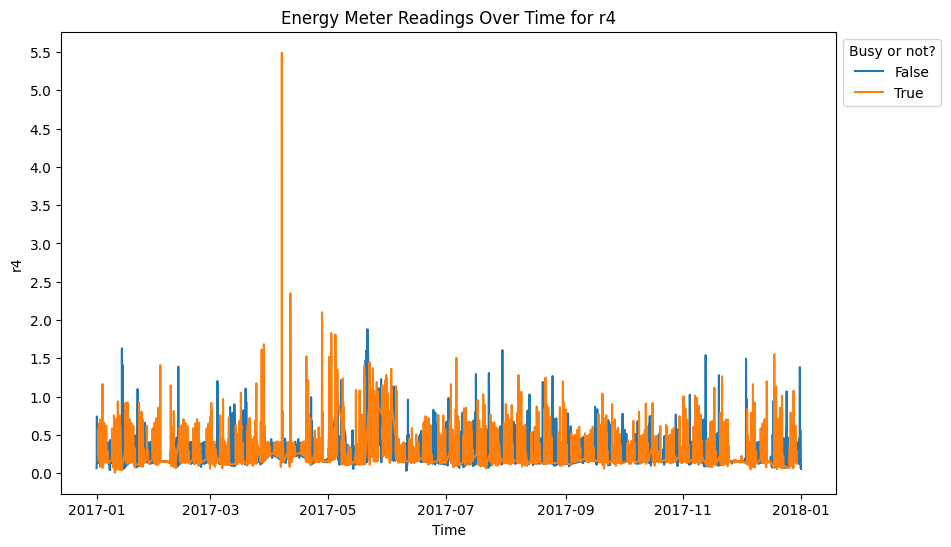

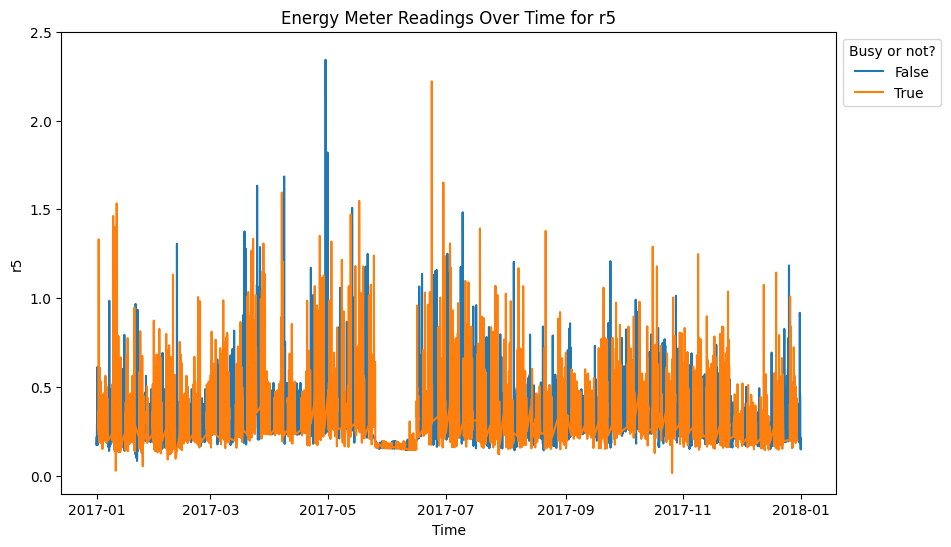

...

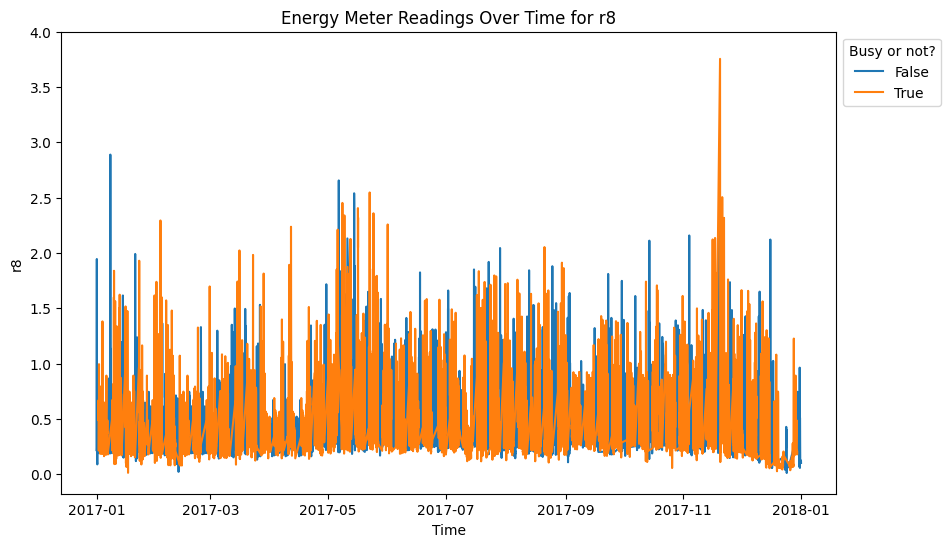

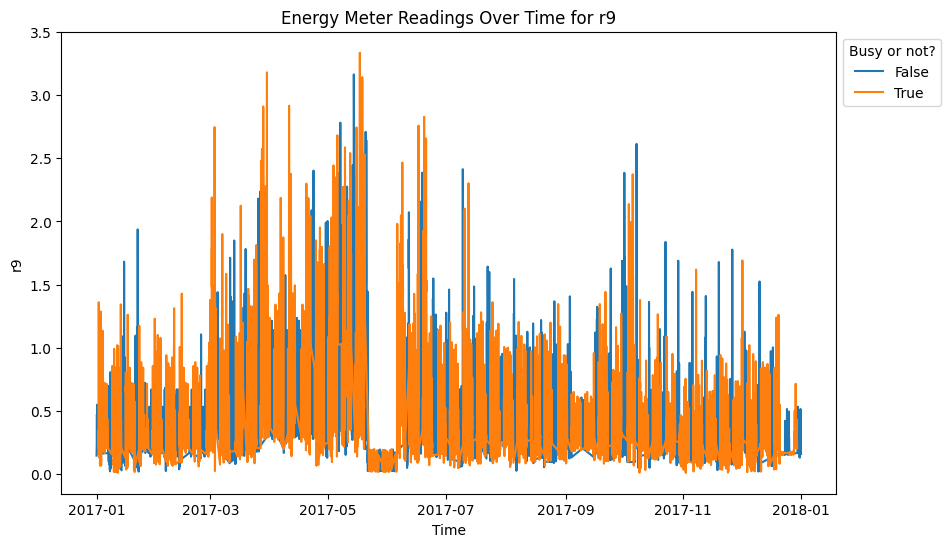

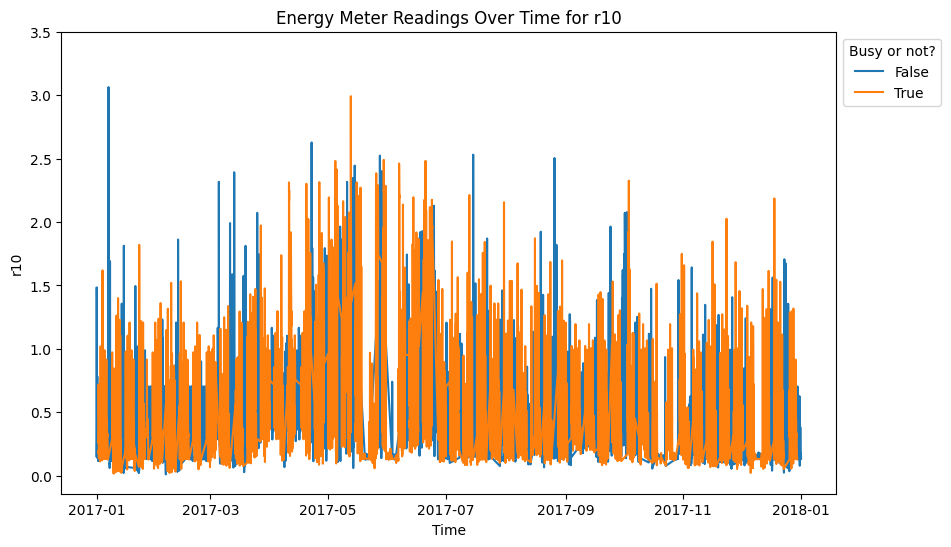

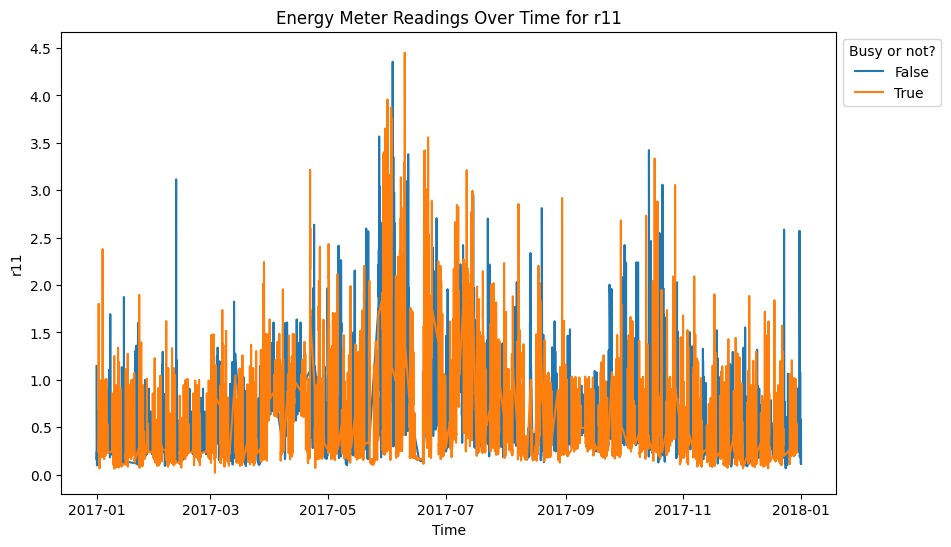

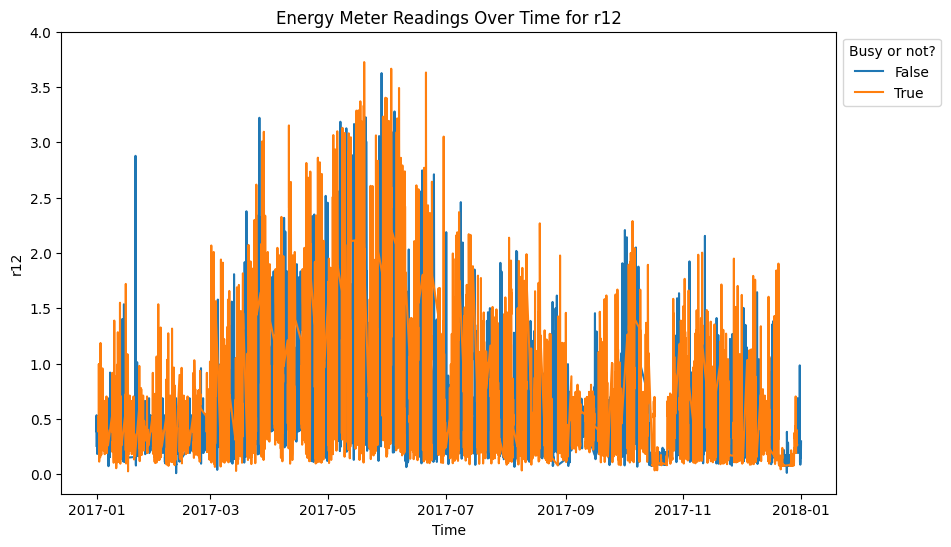

In [ ]:
for i in range(1, 13):
  plot_energy_over_time_busy(i, data)

## Line Plots

In [ ]:
data['Time'] = pd.to_datetime(data['Time']) # makes it easier to extract the components below

# the .dt accessor is used to enable vectorized datetime operations on Series containing datetime-like values
# used to calculate the time averages
data['month'] = data['Time'].dt.month
data['day'] = data['Time'].dt.day
data['hour'] = data['Time'].dt.hour

In [ ]:
# average readings by season, month, day and hour

columns = [f'r{i}' for i in range(1, 13)]

seasonal_avg = data.groupby('season')[columns].mean()
monthly_avg = data.groupby('month')[columns].mean()
daily_avg = data.groupby('day')[columns].mean()
hourly_avg = data.groupby('hour')[columns].mean()

In [ ]:
# function to plot the average value over a given time period
def plot_avg_readings(avg_data, title, x_label):
    plt.figure(figsize=(15, 8))
    ax=plt.gca()
    avg_data.plot(ax=ax) # get current axes, tells the .plot method to use the existing axes for plotting instead of making new ones, otherwise it makes new axes
    plt.title(title)
    plt.xlabel(x_label)
    plt.ylabel('Average Meter Readings')
    plt.legend(loc='upper right')

    if (x_label == 'Hour'):
      plt.xticks(range(0, 25, 1))
    elif (x_label == 'Month'):
      plt.xticks(range(1, 13, 1))

    # ax.xaxis.set_major_locator(plt.MaxNLocator(12))  # Adjusts the maximum number of ticks
    # ax.xaxis.set_minor_locator(plt.AutoMinorLocator())  # Adds minor ticks for finer gridlines

    plt.show()

### Plotting average values by the season

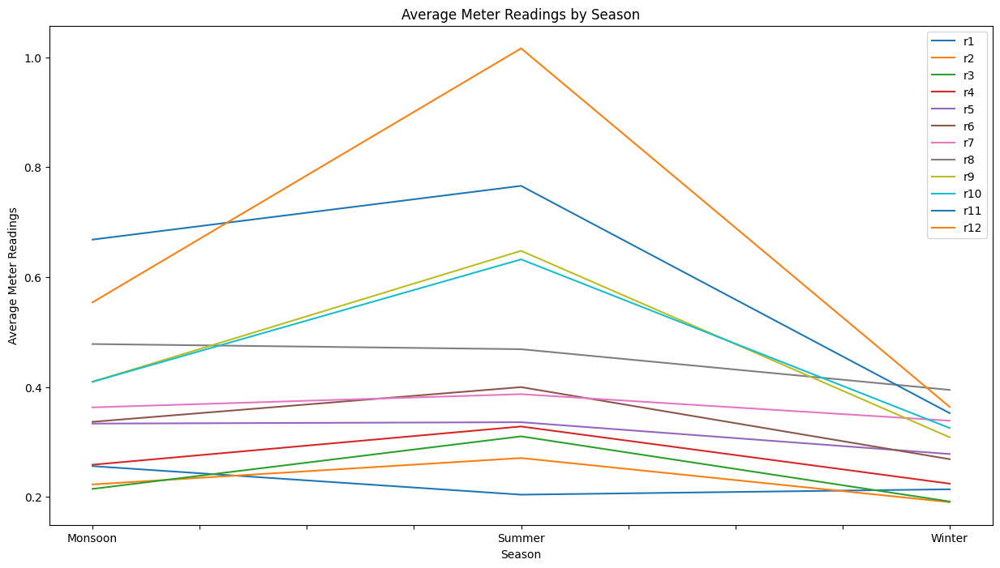

In [ ]:
# plot seasonal average readings
plot_avg_readings(seasonal_avg, 'Average Meter Readings by Season', 'Season')

### Plotting average values by the month

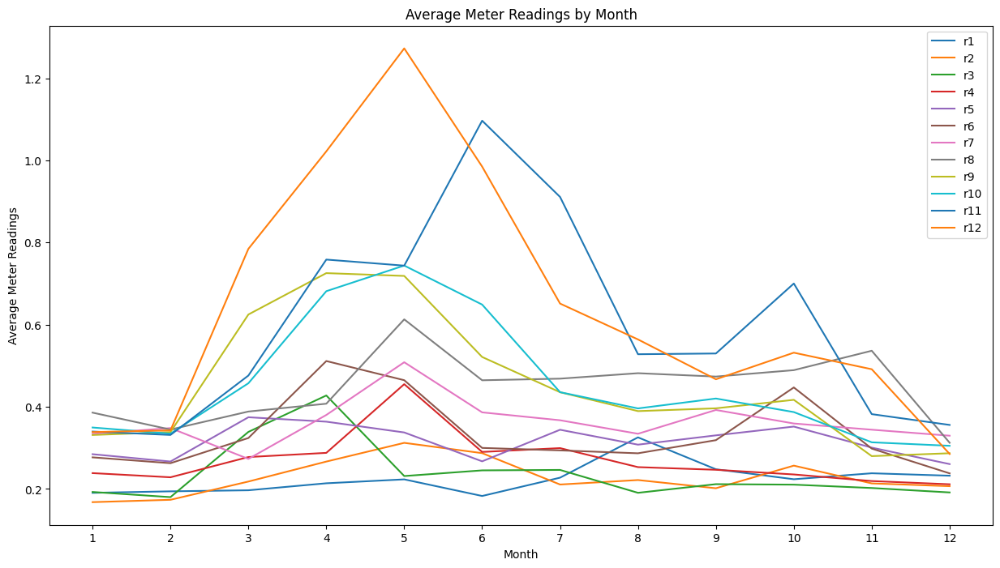

In [ ]:
# plot monthly average readings
plot_avg_readings(monthly_avg, 'Average Meter Readings by Month', 'Month')

### Plotting average values by the day

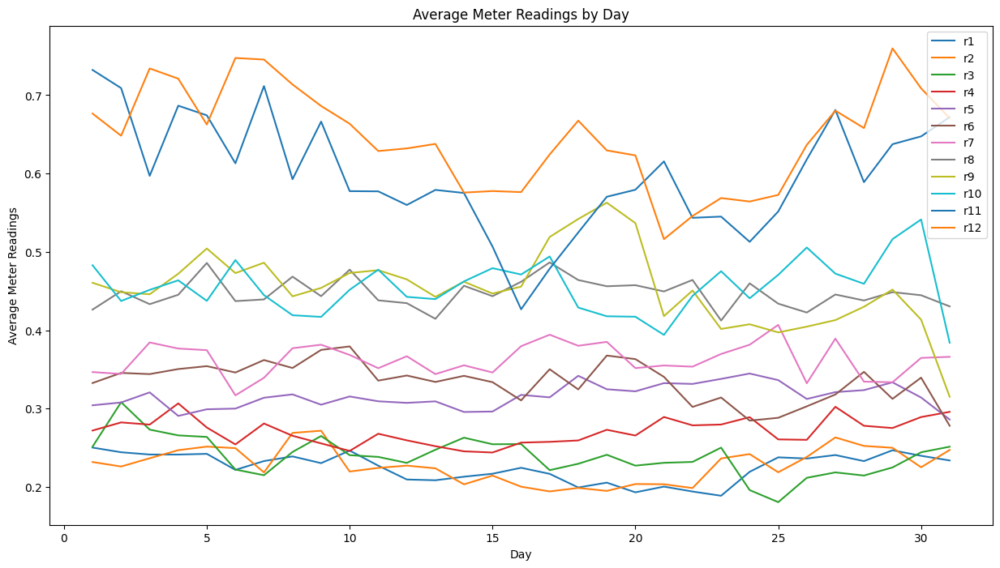

In [ ]:
# plot daily average readings
plot_avg_readings(daily_avg, 'Average Meter Readings by Day', 'Day') # not very helpful because every month is different and there is no trend based on the day of a month

### Plotting average values by the hour

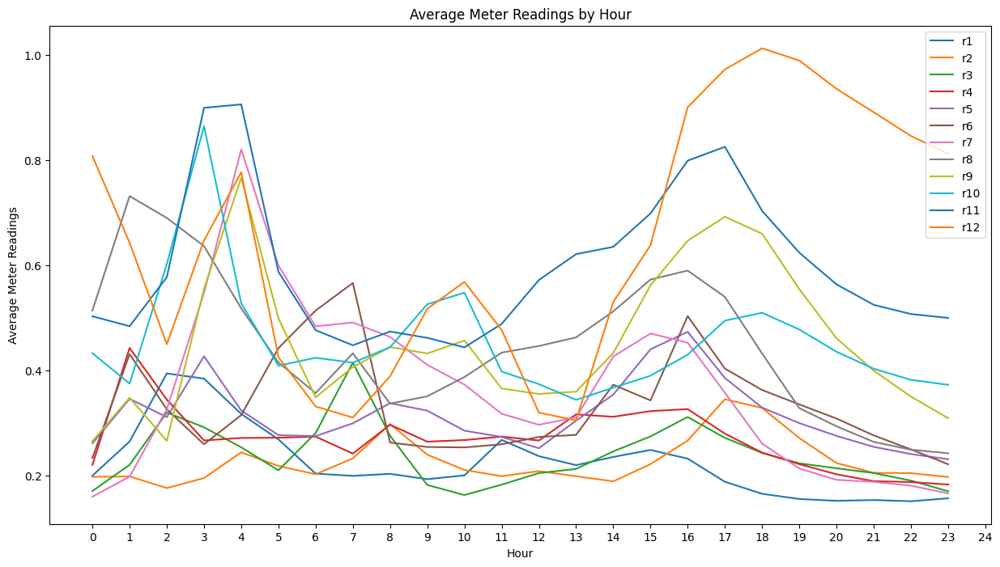

In [ ]:
# plot hourly average readings
plot_avg_readings(hourly_avg, 'Average Meter Readings by Hour', 'Hour') # helpful because every hour of the day has a trend

We can plot the energy readings for one meter on one graph if needed. Below is the code for the same:

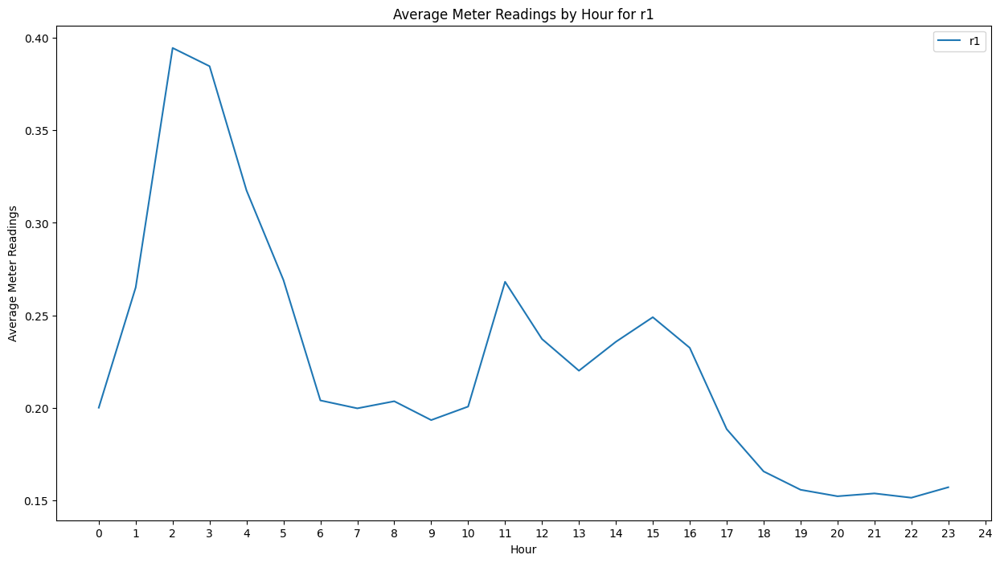

In [ ]:
seasonal_avg_r1 = data.groupby('season')['r1'].mean()
monthly_avg_r1 = data.groupby('month')['r1'].mean()
daily_avg_r1 = data.groupby('day')['r1'].mean()
hourly_avg_r1 = data.groupby('hour')['r1'].mean()

plot_avg_readings(hourly_avg_r1, 'Average Meter Readings by Hour for r1', 'Hour')

## Scatter plots

A scatter plot may be more preferable over a heatmap since there is a continuous range of temperature/humidity present in the dataset and this increases the time taken to plot a heatmap by default without making any significant changes.

In [ ]:
# function to plot scatter plot for temperature vs energy readings
def plot_prop_vs_energy(data, prop, energy_columns, property):
  for col in energy_columns:
    plt.figure(figsize=(10, 6))
    plt.scatter(data[prop], data[col], alpha=0.5)
    plt.title(f'{property} vs {col}')
    plt.xlabel(f'{property}')
    plt.ylabel(f'{col} Reading')
    plt.grid(True)
    plt.show()

### Temperature vs Energy Meter Readings

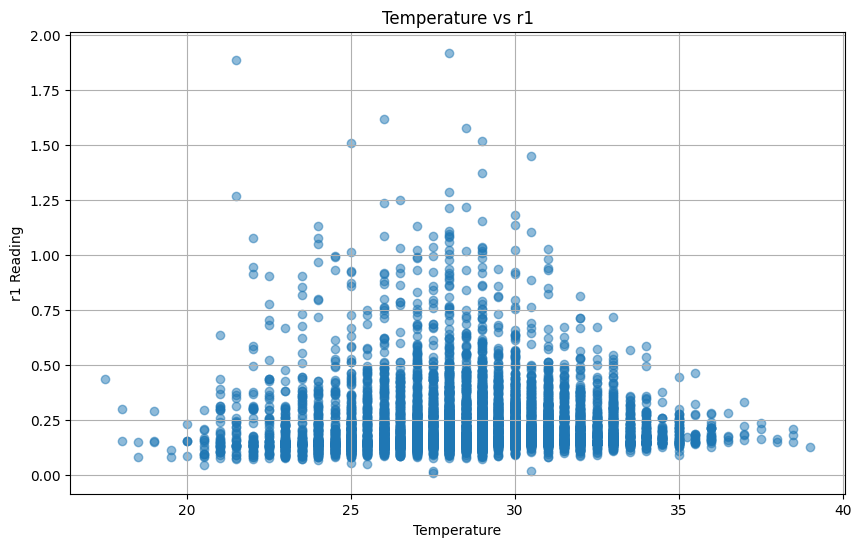

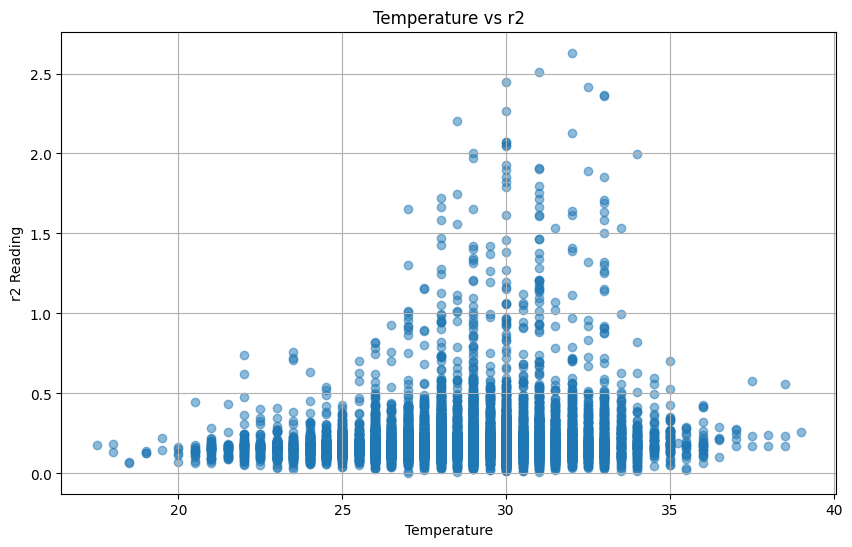

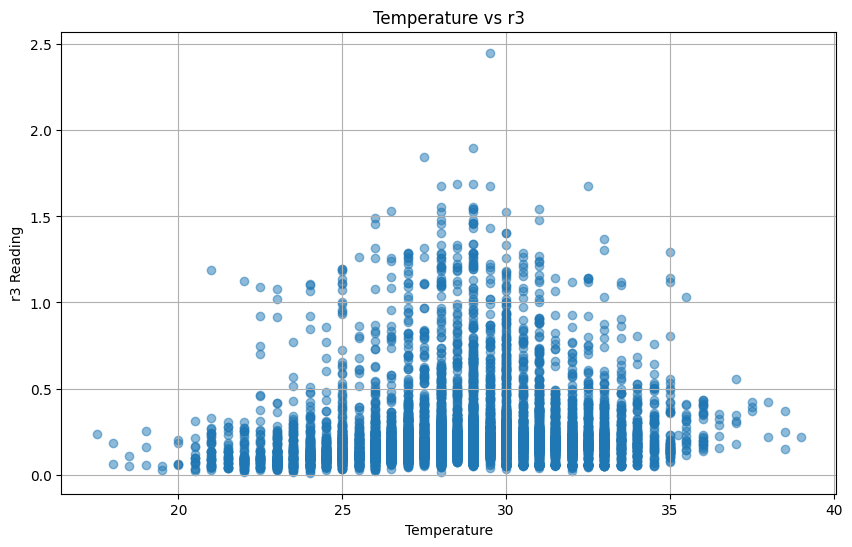

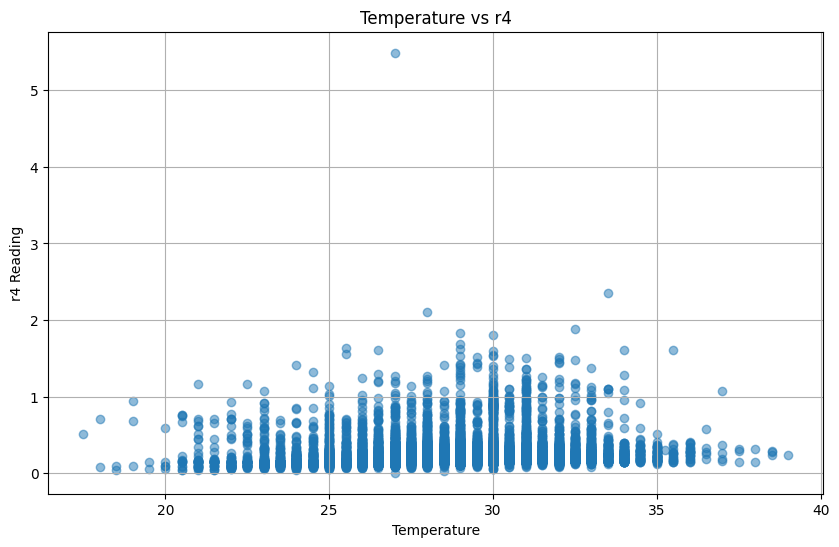

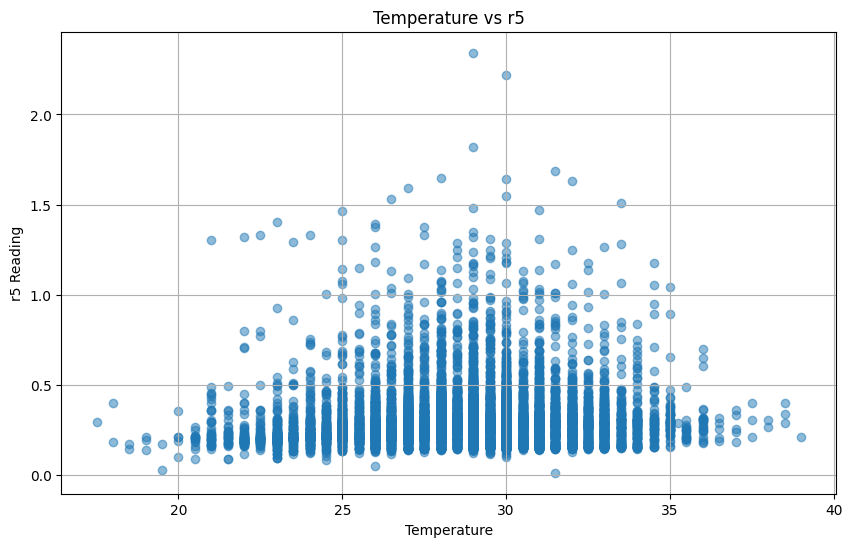

...

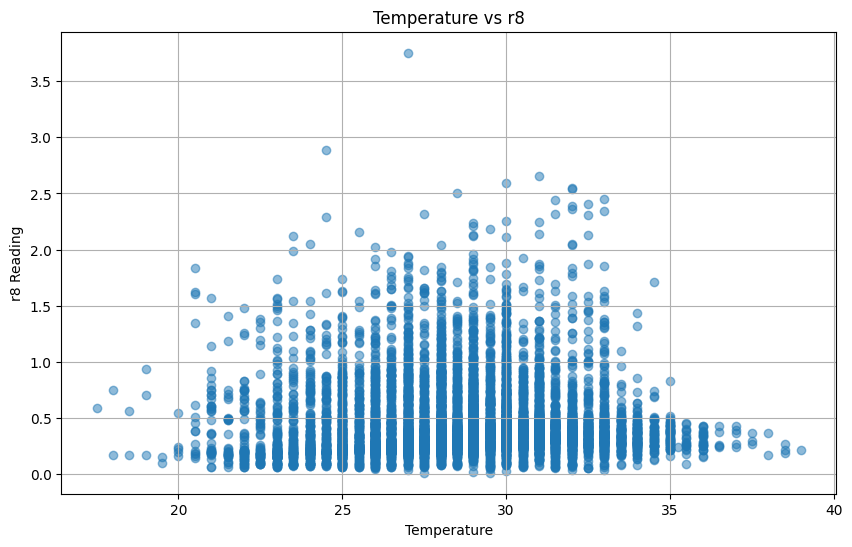

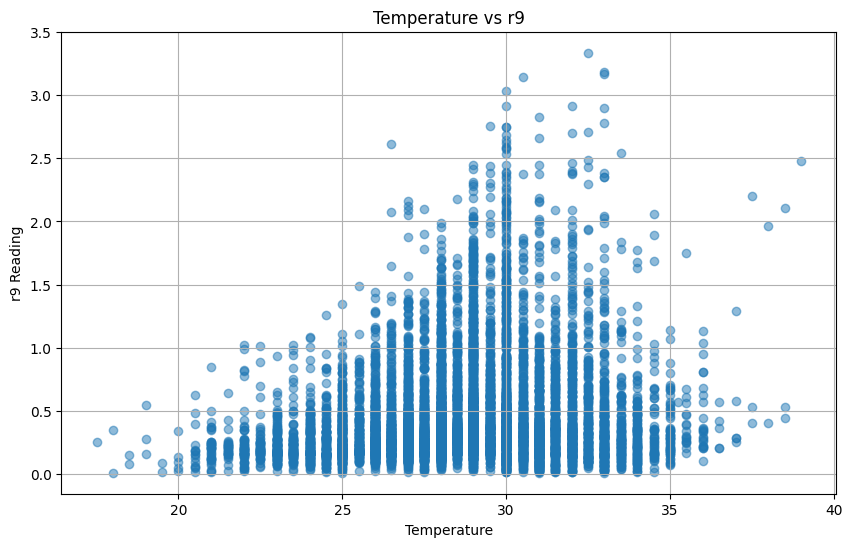

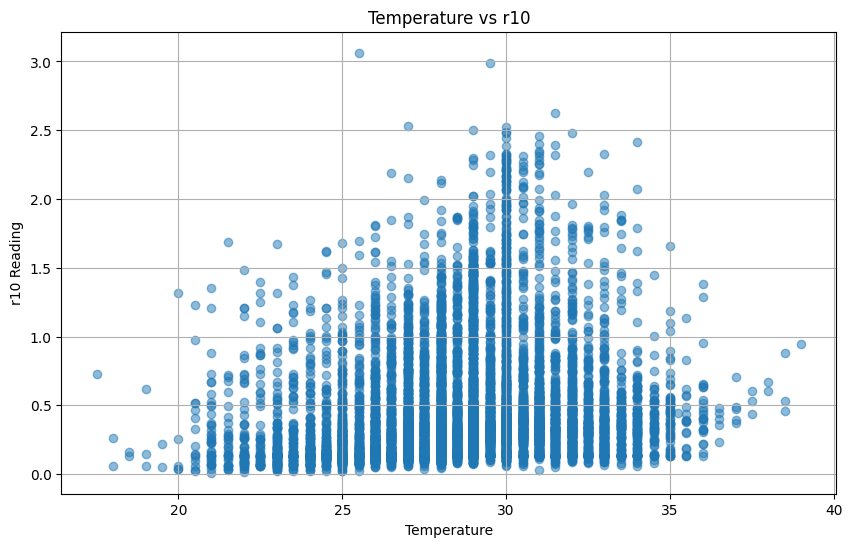

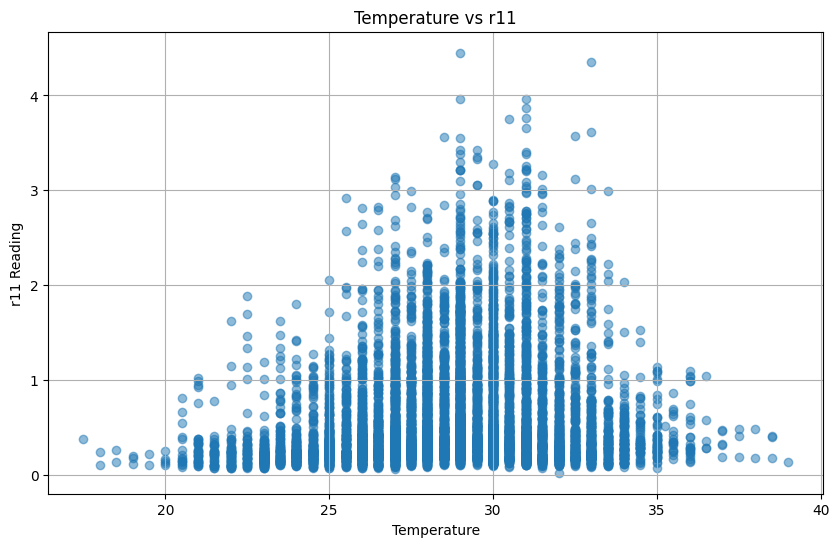

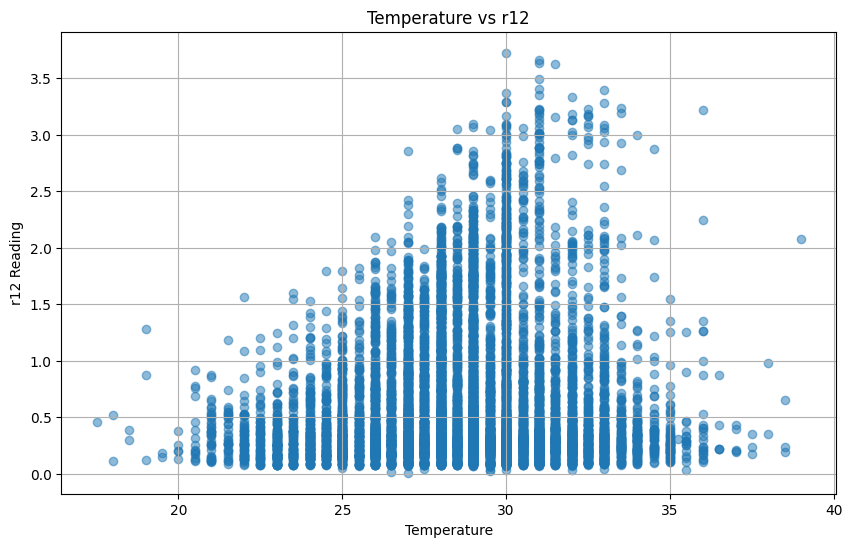

In [ ]:
# temp vs energy meter readings
plot_prop_vs_energy(data, 'temp', columns, 'Temperature')

These plots are very reminiscent of a bell curve with the mean temperature averaging to 27ºC.

### Humidity vs Energy Meter Readings

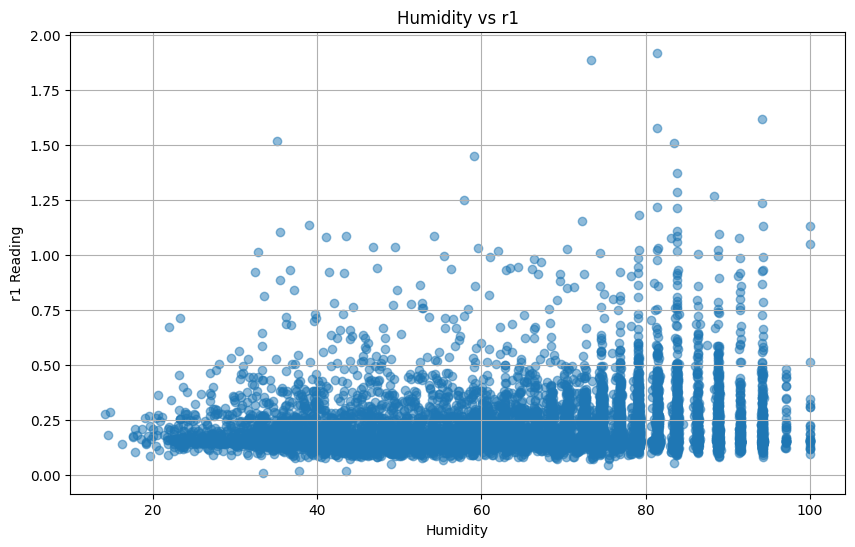

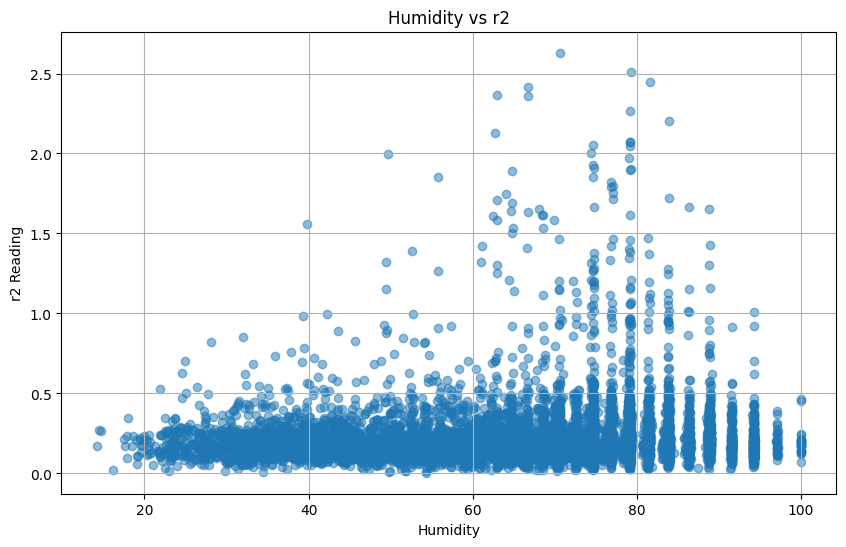

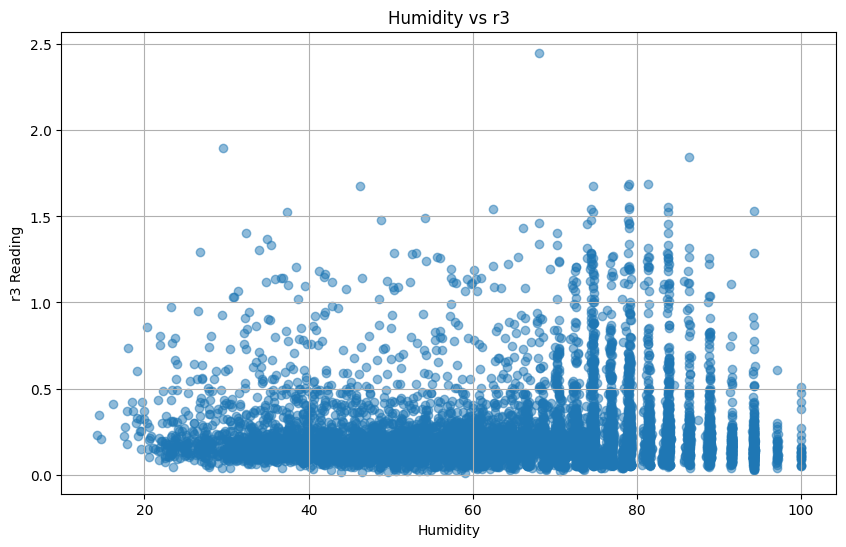

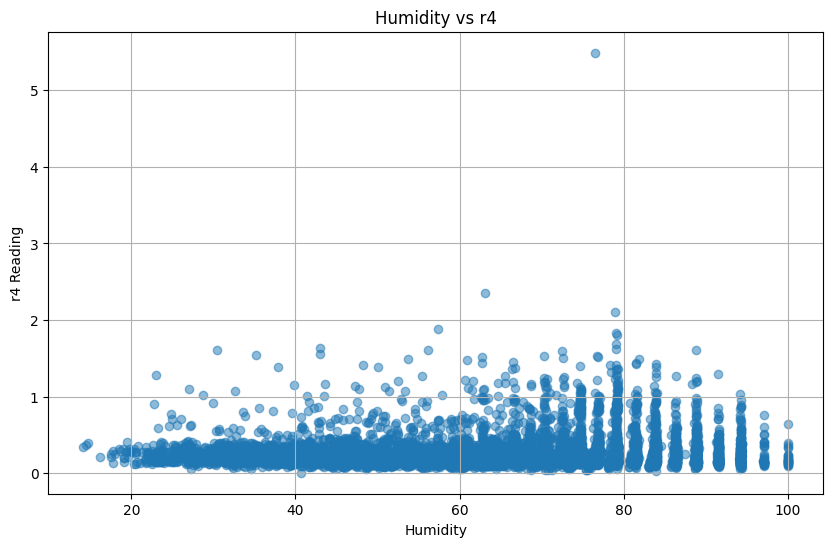

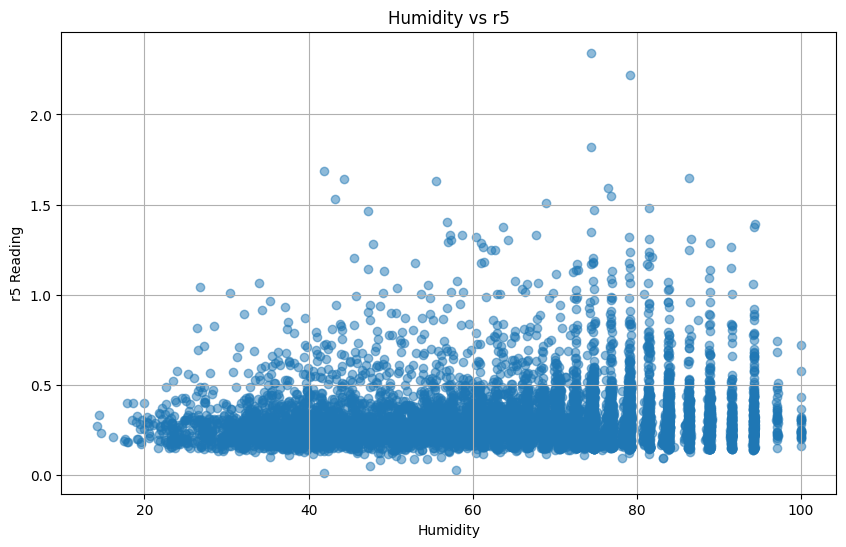

...

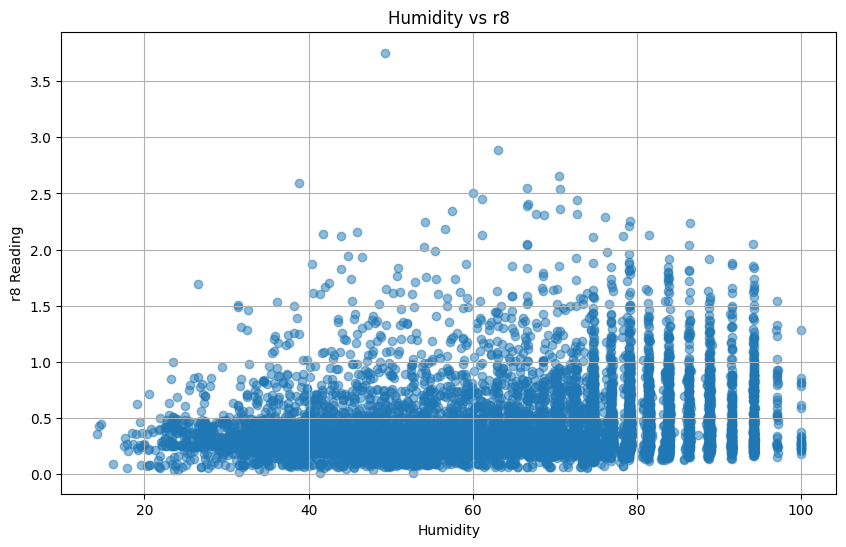

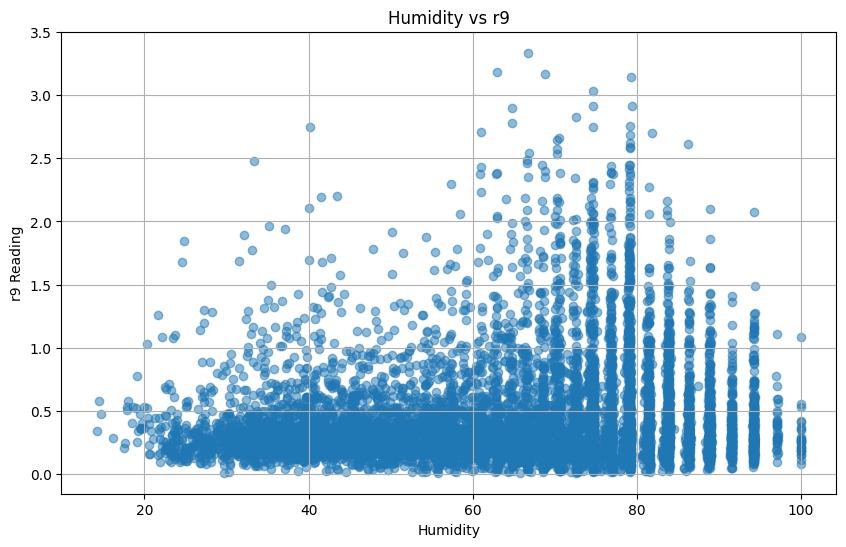

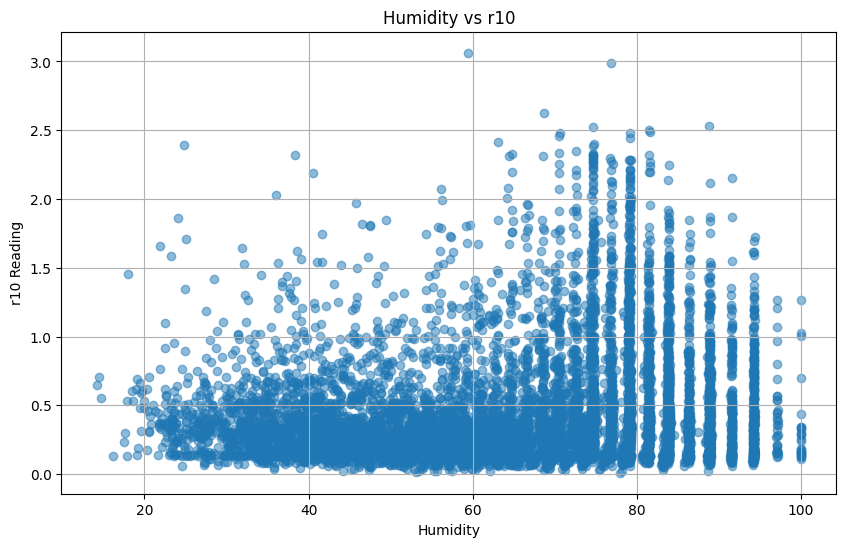

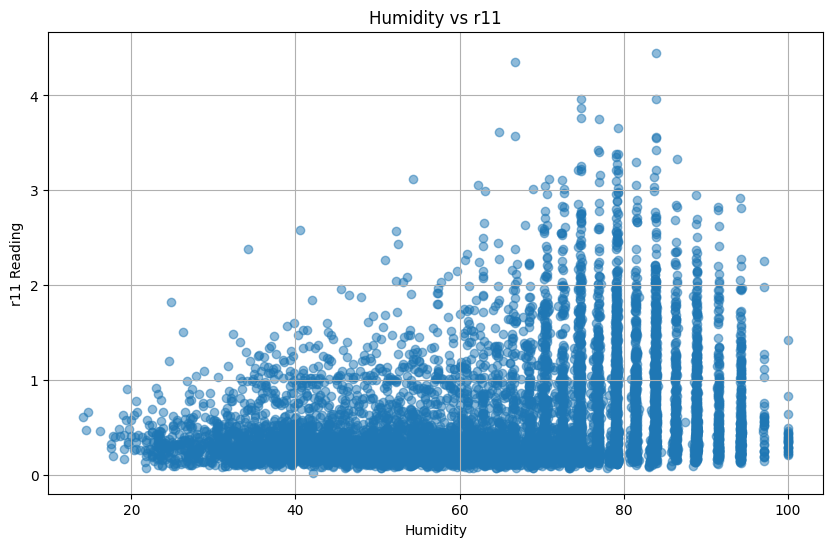

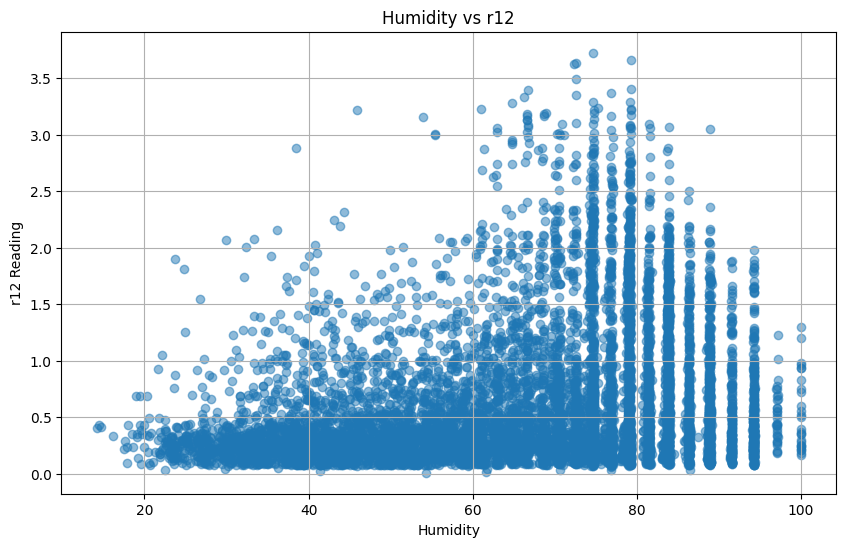

In [ ]:
# humidity vs energy meter readings
plot_prop_vs_energy(data, 'humid', columns, 'Humidity')

Higher the humidity, more the energy meter reading, with the exception of outliers.